# Default Payments of Credit Card Clients in Taiwan in 2005

### Objective : 

Credit card is a commonly used transaction method in modern society and one of the main business of banks. For banks, it helps the bank to generate interest revenue but at the same time, it raise the liquidity risk and credit risk to the bank. In order to control the cash flow and risk, detecting the customers with default payment next month could play an important roles of estimating the potential cash flow and risk management.

In this dataset, there are 25 variables:

- ID: ID of each client
- LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit)
- SEX: Gender (1=male, 2=female)
- EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
- MARRIAGE: Marital status (1 = married; 2 = single; 3 = divorce; 0=others)
- AGE: Age in years
- PAY_0: Repayment status in September, 2005 (-2: No consumption; -1: Paid in full; 0: The use of revolving credit; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above)
- PAY_2: Repayment status in August, 2005 (scale same as above)
- PAY_3: Repayment status in July, 2005 (scale same as above)
- PAY_4: Repayment status in June, 2005 (scale same as above)
- PAY_5: Repayment status in May, 2005 (scale same as above)
- PAY_6: Repayment status in April, 2005 (scale same as above)
- BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
- BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
- BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
- BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
- BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
- BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
- PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
- PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
- PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
- PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
- PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
- PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
- default.payment.next.month(dpnm): Default payment (1=yes, 0=no)

In [1]:
import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import sys 
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff 
%matplotlib inline 

import gc

from datetime import datetime 
from sklearn.model_selection import KFold,GridSearchCV,RandomizedSearchCV,train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline 
from sklearn.metrics import roc_auc_score
from sklearn.utils import resample 
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE,SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier ,ExtraTreesClassifier, AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from catboost import CatBoostClassifier
from scipy.stats import randint as sp_randint
from plotly.subplots import make_subplots
import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report,confusion_matrix,f1_score,roc_auc_score,roc_curve,accuracy_score, recall_score
import warnings
warnings.filterwarnings("ignore")

pd.set_option('precision', 2)
pd.set_option('display.max_columns', 50)


In [2]:
# Import dataset

df = pd.read_csv("default of credit card clients.csv")
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,dpnm
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [3]:
# Check df

df.info()
# 30000 rows and 25columns without missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   ID         30000 non-null  int64
 1   LIMIT_BAL  30000 non-null  int64
 2   SEX        30000 non-null  int64
 3   EDUCATION  30000 non-null  int64
 4   MARRIAGE   30000 non-null  int64
 5   AGE        30000 non-null  int64
 6   PAY_1      30000 non-null  int64
 7   PAY_2      30000 non-null  int64
 8   PAY_3      30000 non-null  int64
 9   PAY_4      30000 non-null  int64
 10  PAY_5      30000 non-null  int64
 11  PAY_6      30000 non-null  int64
 12  BILL_AMT1  30000 non-null  int64
 13  BILL_AMT2  30000 non-null  int64
 14  BILL_AMT3  30000 non-null  int64
 15  BILL_AMT4  30000 non-null  int64
 16  BILL_AMT5  30000 non-null  int64
 17  BILL_AMT6  30000 non-null  int64
 18  PAY_AMT1   30000 non-null  int64
 19  PAY_AMT2   30000 non-null  int64
 20  PAY_AMT3   30000 non-null  int64
 21  PAY_AMT4   3

In [4]:
# drop column "ID"

df.drop('ID', axis = 1, inplace =True) 

In [5]:
# Rename the columns
df.rename(columns={'LIMIT_BAL': 'credit_limit',
                   'SEX': 'gender',
                   'EDUCATION' : 'education',
                   'MARRIAGE' : 'marital_status',
                   'AGE' : 'age',
                   'PAY_1': 'payment_status_sept',
                   'PAY_2': 'payment_status_aug',
                   'PAY_3': 'payment_status_jul',
                   'PAY_4': 'payment_status_jun',
                   'PAY_5': 'payment_status_may',
                   'PAY_6': 'payment_status_apr',
                   'BILL_AMT1': 'bill_sept',
                   'BILL_AMT2': 'bill_aug',
                   'BILL_AMT3': 'bill_jul',
                   'BILL_AMT4': 'bill_jun',
                   'BILL_AMT5': 'bill_may',
                   'BILL_AMT6': 'bill_apr',
                   'PAY_AMT1': 'payment_amount_sept',
                   'PAY_AMT2': 'payment_amount_aug',
                   'PAY_AMT3': 'payment_amount_jul',
                   'PAY_AMT4': 'payment_amount_jun',
                   'PAY_AMT5': 'payment_amount_may',
                   'PAY_AMT6': 'payment_amount_apr',
                   'dpnm' : 'default_payment'}, inplace=True)


In [6]:
# Variables description

df.describe()

,credit_limit,gender,education,marital_status,age,payment_status_sept,payment_status_aug,payment_status_jul,payment_status_jun,payment_status_may,payment_status_apr,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,payment_amount_sept,payment_amount_aug,payment_amount_jul,payment_amount_jun,payment_amount_may,payment_amount_apr,default_payment
count,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,30000.00,3.00e+04,30000.00,30000.00,30000.00,30000.00,3.00e+04,30000.00,30000.00,30000.00,30000.00,30000.00
mean,167484.32,1.60,1.85,1.55,35.49,-0.02,-0.13,-0.17,-0.22,-0.27,-0.29,51223.33,49179.08,4.70e+04,43262.95,40311.40,38871.76,5663.58,5.92e+03,5225.68,4826.08,4799.39,5215.50,0.22
std,129747.66,0.49,0.79,0.52,9.22,1.12,1.20,1.20,1.17,1.13,1.15,73635.86,71173.77,6.93e+04,64332.86,60797.16,59554.11,16563.28,2.30e+04,17606.96,15666.16,15278.31,17777.47,0.42
min,10000.00,1.00,0.00,0.00,21.00,-2.00,-2.00,-2.00,-2.00,-2.00,-2.00,-165580.00,-69777.00,-1.57e+05,-170000.00,-81334.00,-339603.00,0.00,0.00e+00,0.00,0.00,0.00,0.00,0.00
25%,50000.00,1.00,1.00,1.00,28.00,-1.00,-1.00,-1.00,-1.00,-1.00,-1.00,3558.75,2984.75,2.67e+03,2326.75,1763.00,1256.00,1000.00,8.33e+02,390.00,296.00,252.50,117.75,0.00
50%,140000.00,2.00,2.00,2.00,34.00,0.00,0.00,0.00,0.00,0.00,0.00,22381.50,21200.00,2.01e+04,19052.00,18104.50,17071.00,2100.00,2.01e+03,1800.00,1500.00,1500.00,1500.00,0.00
75%,240000.00,2.00,2.00,2.00,41.00,0.00,0.00,0.00,0.00,0.00,0.00,67091.00,64006.25,6.02e+04,54506.00,50190.50,49198.25,5006.00,5.00e+03,4505.00,4013.25,4031.50,4000.00,0.00
max,1000000.00,2.00,6.00,3.00,79.00,8.00,8.00,8.00,8.00,8.00,8.00,964511.00,983931.00,1.66e+06,891586.00,927171.00,961664.00,873552.00,1.68e+06,896040.00,621000.00,426529.00,528666.00,1.00


There are 30,000 distinct credit card clients.

The average value for the amount of credit card limit is 167,484 with max value being 1M.

The average age is 35.

## Exploratory df Analysis (EDA)

### Default Payment Next Month (Target Variable)

Text(0.5, 1.0, 'Default Credit Card Clients - Default Payment Next Month')

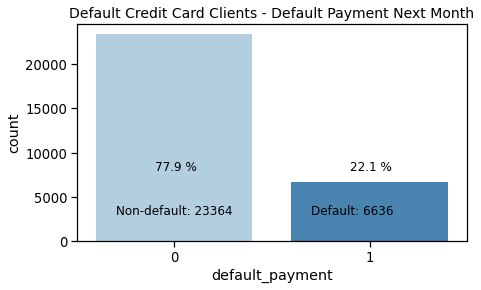

In [7]:
# The frequency of defaults
yes = df['default_payment'].sum()
no = len(df)-yes

# Percentage
yes_perc = round(yes/len(df)*100, 1)
no_perc = round(no/len(df)*100, 1)

plt.figure(figsize=(7,4))
sns.set_context('notebook', font_scale=1.2)
sns.countplot('default_payment',data=df, palette="Blues")
plt.annotate('Non-default: {}'.format(no), xy=(-0.3, 15000), xytext=(-0.3, 3000), size=12)
plt.annotate('Default: {}'.format(yes), xy=(0.7, 15000), xytext=(0.7, 3000), size=12)
plt.annotate(str(no_perc)+" %", xy=(-0.3, 15000), xytext=(-0.1, 8000), size=12)
plt.annotate(str(yes_perc)+" %", xy=(0.7, 15000), xytext=(0.9, 8000), size=12)
plt.title('Default Credit Card Clients - Default Payment Next Month', size=14)

Around 78% of customer are not defaulted, only 22% of customer (6636 customers) have default payment the next month. The dataset is a little bit unbalanced.

### Distribution of Credit Limit

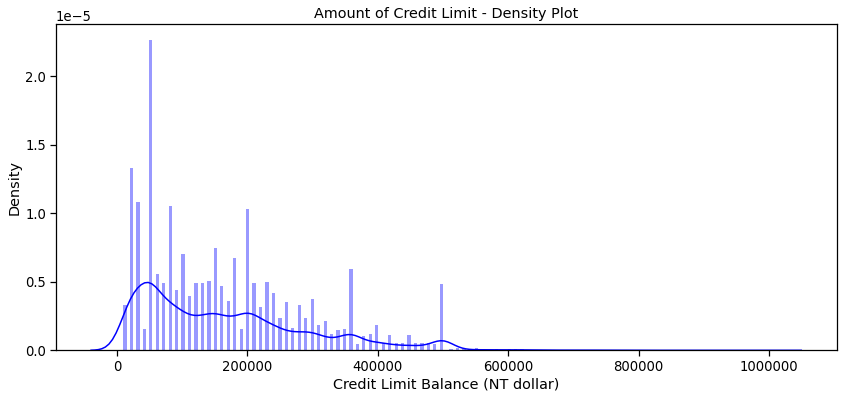

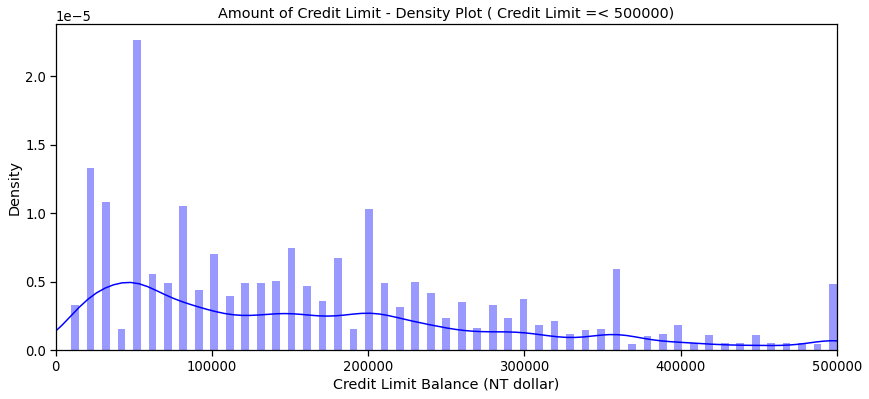

In [8]:
# Amount of credit limit

plt.figure(figsize = (14,6))
plt.title('Amount of Credit Limit - Density Plot')
sns.set_color_codes("pastel")
sns.distplot(df["credit_limit"],kde=True,bins=200, color="blue")
plt.xlabel('Credit Limit Balance (NT dollar)')
plt.ticklabel_format(axis='x',scilimits = (0,1000000))
plt.show()

# Closer look to the amount of credit limit (exclude outliers)

plt.figure(figsize = (14,6))
plt.title('Amount of Credit Limit - Density Plot ( Credit Limit =< 500000)')
sns.set_color_codes("pastel")
sns.distplot(df["credit_limit"],kde=True,bins=200, color="blue")
plt.xlabel('Credit Limit Balance (NT dollar)')
plt.ticklabel_format(axis='x',scilimits = (0,500000))
plt.xlim(0,500000) 
plt.show()

In [9]:
# Largest group of amount of credit limit is for amount of 50K (3365 clients)

df['credit_limit'].value_counts().head(5)

50000     3365
20000     1976
30000     1610
80000     1567
200000    1528
Name: credit_limit, dtype: int64

The distribution of the credit limit is **right-skewed**, meaning the credit limit of customers are usually lower than 200,000 TWD. Credit limit at 50000 TWD has the highest density among all the credit limit levels, followed by 20000 TWD credit limit. 200000 TWD credit limit reaches another peak after the credit limit at 80000 TWD. We can also see the pattern of the credit limit: for every 50000 TWD, the density is higher than the credit limit falls between <50000 TWD interval. **( errrr... I don't know how to explain this : e.g. 60000,140000 , etc are usully less denser than the multiple of 50000)**

### Credit Limit by Default Payment Next Month


Text(0.5, 1.0, 'Credit Limit Balance Histogram by Default Payment Next Month')

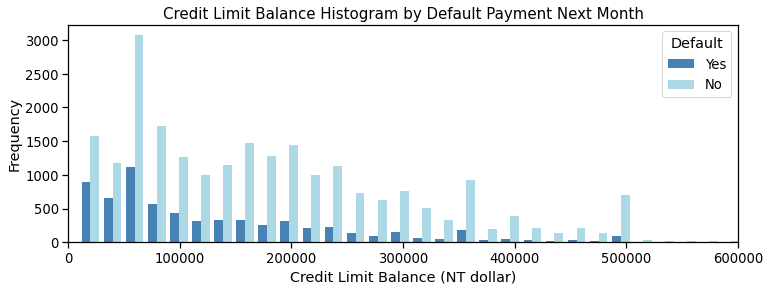

In [10]:
#Frequency of limit balance by default payment next month

x1 = list(df[df['default_payment'] == 1]['credit_limit'])
x2 = list(df[df['default_payment'] == 0]['credit_limit'])

plt.figure(figsize=(12,4))
sns.set_context('notebook', font_scale=1.2)
#sns.set_color_codes("pastel")
plt.hist([x1, x2], bins = 50, density=False, color=['steelblue', 'lightblue'])
plt.xlim([0,600000])
plt.legend(['Yes', 'No'], title = 'Default', loc='upper right', facecolor='white')
plt.xlabel('Credit Limit Balance (NT dollar)')
plt.ylabel('Frequency')
plt.title('Credit Limit Balance Histogram by Default Payment Next Month', size=15)

Both customers with default payments and customers with no default payments have similar right-skewed distribution of credit limit. **The lower the credit limit, the higher the chance of default payment.** For customers with credit limit **lower than 60000 TWD**, **over half** of them have **default payment**. The situation gets better when the credit limit increases from 60000 TWD, the default rate is down to one-third or even lower.

### Gender

In [11]:
# gender

# 1 : Male ; 2 : Female

gender_count = df['gender'].value_counts().reset_index().rename(columns={'index':'gender','gender':'count'})
gender_count.iloc[0,0] = 'Female'
gender_count.iloc[1,0] = 'Male'
# Percentage
gender_count['percentage'] = [round(gender_count.iloc[0,1]/len(df)*100, 1),round(gender_count.iloc[1,1]/len(df)*100, 1)]

gender_count

,gender,count,percentage
0,Female,18112,60.4
1,Male,11888,39.6


In [12]:
fig = px.bar(gender_count, y='count', x='gender', text='percentage',color= 'gender',
            title = 'Count plot of Gender',            
            labels={ # replaces default labels by column name
                "gender": "Gender",  "count": "Count", "percentage": "Percentage"
            },
            color_discrete_map={ # replaces default color mapping by value
                "Male": "royalblue", "Female": "crimson"
            },
            template="simple_white"
            )

fig.update_layout(uniformtext_minsize = 8, uniformtext_mode = 'hide',showlegend = False)
fig.show()

60% of the credit card customers are female and 40% are male.

### Education Level

In [13]:
# education

edu_count = df['education'].value_counts().reset_index().rename(columns={'index':'index','education':'count'})
edu_count 

,index,count
0,2,14030
1,1,10585
2,3,4917
3,5,280
4,4,123
5,6,51
6,0,14


In [14]:
# education

edu_count['index'][0] = 'University'
edu_count['index'][1] = 'Graduate School'
edu_count['index'][2] = 'High School'
edu_count['index'][3] = 'Unknown_5'
edu_count['index'][4] = 'Others'
edu_count['index'][5] = 'Unknown_6'
edu_count['index'][6] = 'Unknown_0'

fig = go.Figure(go.Bar(
    x = edu_count['index'],y = edu_count['count'],text = edu_count['count'],marker={'color': edu_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Distribution of Education Level',xaxis_title="Education Status",yaxis_title="Number of customers")
fig.show()



Most of clients are from university or graduate school.
We have three unknown classes which have no explanation in the document, so we will group them into 'Others' later.

### Marital Status

In [15]:
# Marriage

marriage_count = df['marital_status'].value_counts().reset_index().rename(columns={'index':'class','marital_status':'count'})
marriage_count

,class,count
0,2,15964
1,1,13659
2,3,323
3,0,54


In [16]:
# marital_status
marriage_count['class'][0] = 'Single'
marriage_count['class'][1] = 'Married'
marriage_count['class'][2] = 'Divorce'
marriage_count['class'][3] = 'Others'

fig = go.Figure(go.Bar(
    x = marriage_count['class'],y = marriage_count['count'],text = marriage_count['count'],marker={'color': marriage_count['count']}
    ,textposition = "outside"))
fig.update_layout(title_text='Count plot of Marital Status',xaxis_title="Marital Status",yaxis_title="Number of count")
fig.show()

Over half of the customers are single whereas married customers account for 45% of total number of customers. Only less than 400 customers belong to divorce or others groups.



### Age

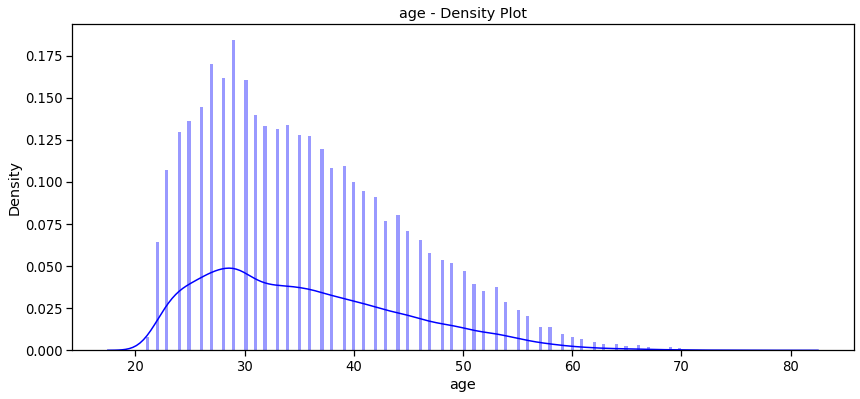

In [17]:
# age

plt.figure(figsize = (14,6))
plt.title('age - Density Plot')
sns.set_color_codes("pastel")
sns.distplot(df["age"],kde=True,bins=200, color="blue")
plt.show()

# There are more clients who are aged between 20-30 and it goes on decreasing after 30

The distribution of age is right-skewed as the majority of customers' age falls between 20 and 40, and the peak is at around 30 years old. 

### Payment Status by Month

In [18]:
# History of past payment status

pay_s = df[['payment_status_sept','payment_status_aug', 'payment_status_jul', 'payment_status_jun', 'payment_status_may', 'payment_status_apr']]
df['payment_status_sept'].value_counts().index.to_list().sort()

fig = make_subplots(rows= 3, cols=2,subplot_titles=pay_s.columns.to_list())  

fig.add_trace(go.Histogram(x= df["payment_status_sept"],name='payment_status_sept'),row = 1, col = 1)
fig.add_trace(go.Histogram(x= df["payment_status_aug"],name='payment_status_aug'),row = 2, col = 2)
fig.add_trace(go.Histogram(x= df["payment_status_jul"],name='payment_status_jul'),row = 3, col = 1)
fig.add_trace(go.Histogram(x= df["payment_status_jun"],name='payment_status_jun'),row = 1, col = 2)
fig.add_trace(go.Histogram(x= df["payment_status_may"],name='payment_status_may'),row = 2, col = 1)
fig.add_trace(go.Histogram(x= df["payment_status_apr"],name='payment_status_apr'),row = 3, col = 2)


fig.update_layout(bargap=0.2,height=600, width=800, title_text="Histogram Subplots of Past Payment Status",showlegend=False)
fig.show()

# Most of clients pay the previous amount duly but there're only some of them who pay late

Meaning of class : 

-2: No consumption;   
-1: Paid in full;  
0: The use of revolving credit;  
1 = payment delay for one month; 
2 = payment delay for two months; 
. . .;  
8 = payment delay for eight months; 
9 = payment delay for nine months and above.  
refer to https://www.kaggle.com/uciml/default-of-credit-card-clients-dataset/discussion/34608  

Overall, less than 1000 customers pay their bills later than 2 months. Among 30000 customers, the use of **revolving credit** is the most popular payment status followed by class -1( Paid in full). At the same time, there are around **3000 to 5000** customers **NOT USING** the credit card at all which may be an **alarm** for the attrition of customers. This group of customers may need some promotions or other marketing campaigns to encourage the use of the credit cards.

Almost every month follows the same distribution except in **September**, there is a significant increase in class 1 (payment delay for one month). Something special could be happened that month where the number of customers using revolving drops below 15000 and they delay the payment for a month.




#### Rules of Assigning Payment Status

In order to understand the rules behind the category of payment status, we dig deep into the data set and conclude the following rules.  

**General Rule :**  
The bill amount of time T should be repaid next month ( payment amount of time T+1) where the payment status of this bill is indicated as payment status at time T
e.g. bill amount of April should be matched with the payment amount of May in order to settle the bill which will give a payment status of -1 (paid in full) in April.  
In other words, we should look at **bill of the first month** and **payment_amount of the second month** and **payment_status of the first month**

1. payment_status_sept is redundant as we have no information about the payment amount in October  
2. payment_amount_apr is also redundant as it is refering to the bill of March which we have no information about it  

Rule 1:  
If the customer has payment of 0 continously, the payment status will add 1 accordingly(i.e. third month of no payment will be 3, the forth month of continuous 0 payment will be 4, so on...)  

Rule 2:  
If the customer has payment of less than a particular percentage of the bill ( varies amongst customers which we do not know)   
1. if the payment is less 5% of the bill amount for some customers with the payment status 0 in previous month, it counts as late payment of 2 months  
2. If the payment is less 5% of the bill amount for some customers with the payment status <0 in previous month, the payment status will increase 1 ( e.g. 3->4)  
    
Rule 3:  
If the customer has payment more than a particular percentage of the bill but not in full, it counts as the use of revolving credit(class 0)
 


In [105]:
## General Rule
# payment_status of the first month refers to the bill of the first month and payment_amount of the second month
# e.g row 611, the bill amount in April and payment amount in May are the same, thus the payment status in April is -1 (paid in full)

fil = ((df.payment_status_aug == 0) & (df.bill_aug == df.payment_amount_sept))
df[fil][['payment_status_apr', 'bill_apr', 'payment_amount_may','payment_status_may', 
         'bill_may','payment_amount_jun', 'payment_status_jun','bill_jun','payment_amount_jul', 'payment_status_jul','bill_jul',
        'payment_amount_aug', 'payment_status_aug','bill_aug','payment_amount_sept', 'payment_status_sept','bill_sept','default_payment']].head(5)

,payment_status_apr,bill_apr,payment_amount_may,payment_status_may,bill_may,payment_amount_jun,payment_status_jun,bill_jun,payment_amount_jul,payment_status_jul,bill_jul,payment_amount_aug,payment_status_aug,bill_aug,payment_amount_sept,payment_status_sept,bill_sept,default_payment
232,0,46557,1747,-1,45567,45567,-1,2624,2624,-2,0,0,0,0,0,0,102800,0
258,-2,0,0,-2,0,0,-2,0,0,-2,0,0,0,0,0,0,62170,0
453,-2,871,871,-2,1443,1443,-2,1443,1443,-2,1443,1443,0,179,179,0,156786,0
611,-1,2650,2650,-2,0,0,-2,0,0,-2,0,0,0,0,0,0,3280,1
622,-2,0,0,-2,0,0,-2,0,0,-2,0,0,0,0,0,0,7624,0


In [22]:
## Rule 1
# If the customer has payment of 0 continously, the payment status will add 1 accordingly(i.e. third month of no payment will be 3, 
# the forth month of continuous 0 payment will be 4, so on...)

fil = ((df.payment_status_aug == 5))
df[fil][['payment_status_apr', 'bill_apr', 'payment_status_may', 'payment_amount_may',
         'bill_may','payment_amount_jun', 'payment_status_jun','bill_jun','payment_amount_jul', 'payment_status_jul','bill_jul',
        'payment_amount_aug', 'payment_status_aug','bill_aug','payment_amount_sept', 'payment_status_sept','bill_sept','default_payment']].head(15)

,payment_status_apr,bill_apr,payment_status_may,payment_amount_may,bill_may,payment_amount_jun,payment_status_jun,bill_jun,payment_amount_jul,payment_status_jul,bill_jul,payment_amount_aug,payment_status_aug,bill_aug,payment_amount_sept,payment_status_sept,bill_sept,default_payment
189,2,20487,3,760,20219,0,4,20835,0,4,21461,1000,5,21087,0,1,21703,0
4801,0,188113,2,142000,199480,0,3,202639,0,4,218603,0,5,237094,0,6,254951,1
6373,0,96160,2,3469,96238,0,3,97883,0,4,100328,0,5,102832,3504,4,101762,1
6702,0,56163,2,1925,67439,0,3,68468,2000,4,67976,0,5,69676,0,6,71310,1
6828,0,14090,2,3000,11460,0,3,11790,0,4,12276,0,5,12762,0,1,13242,1
7856,3,305413,2,0,311256,10000,3,306395,10000,4,302869,0,5,309330,0,1,315632,1
7961,0,18021,2,636,17816,0,3,18248,0,4,18840,0,5,19432,0,4,20014,1
8230,0,30016,2,3100,30162,0,3,30748,0,4,31499,0,5,32319,0,4,33100,1
8656,0,28961,2,5000,30000,0,3,30321,0,4,31397,0,5,32351,0,6,33134,0
9079,6,53625,7,0,55033,0,8,55815,0,4,56623,10000,5,47426,0,1,48481,0


In [92]:
## Rule 2

# If the customer has payment of less than a particular percentage of the bill ( varies amongst customers which we do not know) 
# a) let's say if the payment is less 5% of the bill amount for some customers with the payment status 0 in previous month,
#    it counts as late payment of 2 months
#    e.g. row 102, the customer pays 3.5% of the bill(487066 NTD) in June which gives him or her a payment status 2(late for 2 months),
#         but he/she pays 11.6% of the bill in July(479432 NTD) which gives him/her a payment status 0 (the use of revolving credit)
# b) If the payment is less 5% of the bill amount for some customers with the payment status <0 in previous month,
#    the payment status will increase 1 ( e.g. 3->4)

fil = ((df.payment_status_jun == 2))
df[fil][['payment_status_apr', 'bill_apr', 'payment_status_may', 'payment_amount_may',
         'bill_may','payment_amount_jun', 'payment_status_jun','bill_jun','payment_amount_jul', 'payment_status_jul','bill_jul',
        'payment_amount_aug', 'payment_status_aug','bill_aug','payment_amount_sept', 'payment_status_sept','bill_sept','default_payment']].head(15)

,payment_status_apr,bill_apr,payment_status_may,payment_amount_may,bill_may,payment_amount_jun,payment_status_jun,bill_jun,payment_amount_jul,payment_status_jul,bill_jul,payment_amount_aug,payment_status_aug,bill_aug,payment_amount_sept,payment_status_sept,bill_sept,default_payment
16,2,19104,2,1650,17905,0,2,18338,1500,2,17428,0,0,18010,3200,0,15376,1
22,2,46012,2,0,46905,3601,2,44006,0,0,45020,3582,0,42445,2007,2,41087,1
44,0,29197,0,3000,26636,2000,2,25209,0,0,25921,5000,0,21295,3000,0,18927,0
50,0,39362,2,1500,38659,0,2,39423,2000,2,38355,3100,2,36171,0,1,37042,1
58,2,1414,2,1200,700,0,2,1166,700,2,782,0,3,1098,0,-1,1587,0
62,2,28264,2,1200,27667,2225,2,25865,0,2,26591,2700,2,24300,0,2,24987,1
71,2,63526,2,2400,62307,4800,2,58622,0,2,60184,2500,2,59246,2500,2,58267,1
90,2,149531,2,5000,147124,5500,2,144098,5500,2,142460,5500,2,140774,6300,2,138180,1
102,0,469961,2,18000,471145,0,2,487066,17000,0,479432,55693,0,431342,16078,0,422069,0
104,0,55305,2,3000,55447,6,2,60218,2511,2,59175,5000,2,55208,0,2,56685,0


In [21]:
## Rule 3 

# If the customer has payment more than a particular percentage of the bill but not in full, it counts as the use 
# of revolving credit(class 0)
# For example, row 53, the customer needs to pay 43510 in June but he/she only pays 1762(payment_amount_jul) and gets the
# payment status 0 for June

fil = ((df.payment_status_aug == 2) & (df.bill_aug > 0) & (df.payment_amount_sept > 0))
df[fil][['payment_status_apr', 'payment_amount_apr', 'bill_apr', 'payment_status_may', 'payment_amount_may',
         'bill_may','payment_amount_jun', 'payment_status_jun','bill_jun','payment_amount_jul', 'payment_status_jul','bill_jul',
        'payment_amount_aug', 'payment_status_aug','bill_aug','payment_amount_sept', 'payment_status_sept','bill_sept','default_payment']].head(15)

,payment_status_apr,payment_amount_apr,bill_apr,payment_status_may,payment_amount_may,bill_may,payment_amount_jun,payment_status_jun,bill_jun,payment_amount_jul,payment_status_jul,bill_jul,payment_amount_aug,payment_status_aug,bill_aug,payment_amount_sept,payment_status_sept,bill_sept,default_payment
13,2,0,36894,0,1500,36137,3000,0,66782,3000,2,65701,0,2,67369,3200,1,65802,1
53,0,1622,45319,0,1790,44420,1762,0,43510,1762,0,42758,2010,2,41742,1300,1,41402,0
66,0,160,4326,0,200,4196,200,0,4062,150,2,3978,0,2,4193,2300,2,2097,1
71,2,1600,63526,2,2400,62307,4800,2,58622,0,2,60184,2500,2,59246,2500,2,58267,1
90,2,5000,149531,2,5000,147124,5500,2,144098,5500,2,142460,5500,2,140774,6300,2,138180,1
112,3,5000,149415,2,0,152174,14850,2,144401,14254,2,134813,0,2,138532,6500,2,135673,0
120,2,0,51143,2,2800,49318,1400,3,48851,1000,2,48953,4035,2,45976,1000,2,46004,1
129,0,1500,26547,0,1100,29510,1200,0,28853,1200,2,57244,7,2,61450,2504,3,60521,0
142,0,600,18065,0,800,19879,700,2,19996,400,2,20583,10000,2,10833,1000,1,10131,0
147,0,8500,59875,0,5000,132233,5000,0,135668,55500,0,93069,5000,2,176192,8000,1,197236,0


We can see that the payment status is weird as there are only a few "1" in the previous 5 months (April - August) but a hugh increase in September ( refering to the barplots). The payment status jumps from 0 to 2 if the customer fails to repay a certain amount, that means they suddenly get late payment for 2 months but no late payment the previous month (i.e 0) instead of 1 month late payment before. This is very strange and that month should be 1 for payment status instead of 2.   
Even 2+ month of late payment does not actually mean the length of late payment, e.g payment status 3 actually means 2 month based on the previous repayment record. We will try to fix this problem in the feature engineering part and compare with the original result.

In [24]:
## Extra finding 1
# Customers with no consumption for the past 6 months

fil = ((df.bill_apr == 0) & (df.bill_may == 0) & (df.bill_jun == 0) & (df.bill_jul == 0) & (df.bill_aug == 0) & (df.bill_sept == 0) )
#fil = ((df.payment_status_aug == 2) & (df.bill_aug > 0) & (df.payment_amount_sept > 0))
df[fil][['payment_status_apr', 'bill_apr', 'payment_amount_may', 'payment_status_may',
         'bill_may','payment_amount_jun', 'payment_status_jun','bill_jun','payment_amount_jul', 'payment_status_jul','bill_jul',
        'payment_amount_aug', 'payment_status_aug','bill_aug','payment_amount_sept', 'payment_status_sept','bill_sept','default_payment']]

,payment_status_apr,bill_apr,payment_amount_may,payment_status_may,bill_may,payment_amount_jun,payment_status_jun,bill_jun,payment_amount_jul,payment_status_jul,bill_jul,payment_amount_aug,payment_status_aug,bill_aug,payment_amount_sept,payment_status_sept,bill_sept,default_payment
18,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,0
19,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,0
45,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,1
79,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
121,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29908,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,1
29909,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0
29973,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
29979,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,0


**866 customers** do not use their credit cards at all for the past 6 months, the bank may issue some special offer to them in order to retain the customers and increase the utilization ratio of the credit card.  

Among these 866 customers, we find that 317 customers have default payment next month as following:

In [25]:
## Extra Finding 2
# No bill amount but default payment next month (1)

fil = ((df.bill_apr == 0) & (df.bill_may == 0) & (df.bill_jun == 0) & (df.bill_jul == 0) & (df.bill_aug == 0) & (df.bill_sept == 0) & (df.default_payment == 1))
#fil = ((df.payment_status_aug == 2) & (df.bill_aug > 0) & (df.payment_amount_sept > 0))
df[fil][['payment_status_apr', 'payment_amount_apr', 'bill_apr', 'payment_status_may', 'payment_amount_may',
         'bill_may','payment_amount_jun', 'payment_status_jun','bill_jun','payment_amount_jul', 'payment_status_jul','bill_jul',
        'payment_amount_aug', 'payment_status_aug','bill_aug','payment_amount_sept', 'payment_status_sept','bill_sept','default_payment']]

,payment_status_apr,payment_amount_apr,bill_apr,payment_status_may,payment_amount_may,bill_may,payment_amount_jun,payment_status_jun,bill_jun,payment_amount_jul,payment_status_jul,bill_jul,payment_amount_aug,payment_status_aug,bill_aug,payment_amount_sept,payment_status_sept,bill_sept,default_payment
45,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,1
79,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
121,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
140,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
272,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29760,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,1
29823,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
29830,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,1,0,1
29908,-2,0,0,-2,0,0,0,-2,0,0,-2,0,0,-2,0,0,-2,0,1


There are 317 customers have no consumption at all but some of them have payment status 1 (1 month late payment) in September and default payment next month which do **not make sense**. 
Therefore we will assign 0 (no default payment) in the feature engineering part. 

### Bill Amount

In [93]:
# History of bill amount

pay_s = df[['bill_sept','bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr']]
df['bill_sept'].value_counts().index.to_list().sort()

fig = make_subplots(rows= 3, cols=2,subplot_titles=pay_s.columns.to_list())  

fig.add_trace(go.Histogram(x= df["bill_sept"],name='bill_sept'),row = 1, col = 1)
fig.add_trace(go.Histogram(x= df["bill_aug"],name='bill_aug'),row = 2, col = 2)
fig.add_trace(go.Histogram(x= df["bill_jul"],name='bill_jul'),row = 3, col = 1)
fig.add_trace(go.Histogram(x= df["bill_jun"],name='bill_jun'),row = 1, col = 2)
fig.add_trace(go.Histogram(x= df["bill_may"],name='bill_may'),row = 2, col = 1)
fig.add_trace(go.Histogram(x= df["bill_apr"],name='bill_apr'),row = 3, col = 2)


fig.update_layout(bargap=0.2,height=600, width=800, title_text="Histogram Subplots of Past Bill Amount",showlegend=False)
fig.show()

The distribution of the bill amount every month is right-skewed. **Around 6000 to 8000 customers** have their bill amount **less than 5000 NTD** every month which shows that the credit card of our bank may not be the first choice of their payment method. Marketing department may try to encourage the utilization of the card by initialing some promotion and campaigns with merchants.

### Payment Amount and Bill Amount


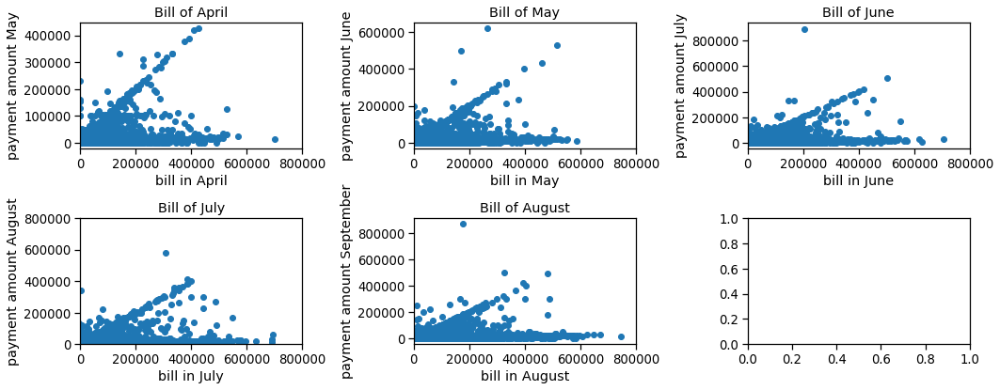

In [163]:
# Payment Amount and Bill Amount

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 6))

axes[0, 0].scatter(x = df['bill_apr'], y = df['payment_amount_may'])
axes[0, 0].set_xlabel('bill in April')
axes[0, 0].set_ylabel('payment amount May')
axes[0, 0].set_title('Bill of April')
axes[0, 0].set_xlim([0, 800000])

axes[0, 1].scatter(x = df['bill_may'], y = df['payment_amount_jun'])
axes[0, 1].set_xlabel('bill in May')
axes[0, 1].set_ylabel('payment amount June')
axes[0, 1].set_title('Bill of May')
axes[0, 1].set_xlim([0, 800000])

axes[0, 2].scatter(x = df['bill_jun'], y = df['payment_amount_jul'])
axes[0, 2].set_xlabel('bill in June')
axes[0, 2].set_ylabel('payment amount July')
axes[0, 2].set_title('Bill of June')
axes[0, 2].set_xlim([0, 800000])

axes[1, 0].scatter(x = df['bill_jul'], y = df['payment_amount_aug'])
axes[1, 0].set_xlabel('bill in July')
axes[1, 0].set_ylabel('payment amount August')
axes[1, 0].set_title('Bill of July')
axes[1, 0].set_xlim([0, 800000])
axes[1, 0].set_ylim([0, 800000])

axes[1, 1].scatter(x = df['bill_aug'], y = df['payment_amount_sept'])
axes[1, 1].set_xlabel('bill in August')
axes[1, 1].set_ylabel('payment amount September')
axes[1, 1].set_title('Bill of August')
axes[1, 1].set_xlim([0, 800000])

plt.tight_layout()

The majority of the customer pay **less than 200,000** every month regardless their bill amount. There are two groups/trends of the customers' payment and bill amount. The first group is they pay what they owe or proportionally (the inclined line). The second group is they barely pay or even 0 payment no matter how big the bill amount is.

###  payment amount

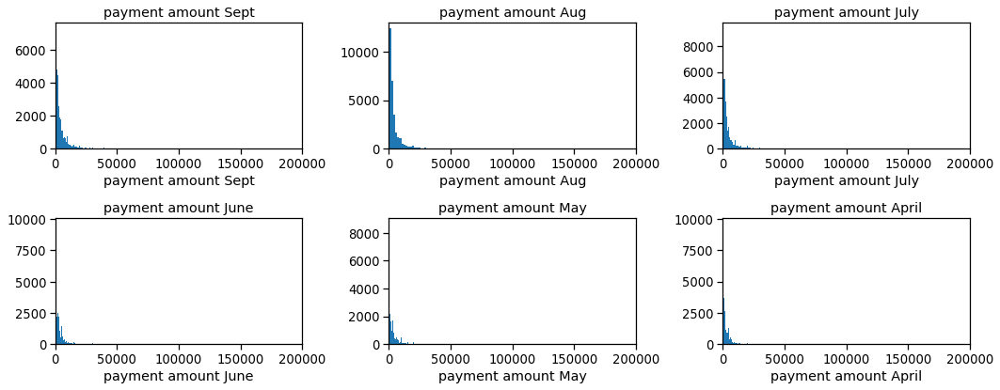

In [186]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 6))

axes[0, 0].hist(x = df['payment_amount_sept'], bins = 1000)
axes[0, 0].set_xlabel('payment amount Sept')
axes[0, 0].set_title('payment amount Sept')
axes[0, 0].set_xlim([0, 200000])

axes[0, 1].hist(x = df['payment_amount_aug'], bins = 1000)
axes[0, 1].set_xlabel('payment amount Aug')
axes[0, 1].set_title('payment amount Aug')
axes[0, 1].set_xlim([0, 200000])

axes[0, 2].hist(x = df['payment_amount_jul'], bins = 1000)
axes[0, 2].set_xlabel('payment amount July')
axes[0, 2].set_title('payment amount July')
axes[0, 2].set_xlim([0, 200000])

axes[1, 0].hist(x = df['payment_amount_jun'], bins = 1000)
axes[1, 0].set_xlabel('payment amount June')
axes[1, 0].set_title('payment amount June')
axes[1, 0].set_xlim([0, 200000])

axes[1, 1].hist(x = df['payment_amount_may'], bins = 1000)
axes[1, 1].set_xlabel('payment amount May')
axes[1, 1].set_title('payment amount May')
axes[1, 1].set_xlim([0, 200000])

axes[1, 2].hist(x = df['payment_amount_apr'], bins = 1000)
axes[1, 2].set_xlabel('payment amount April')
axes[1, 2].set_title('payment amount April')
axes[1, 2].set_xlim([0, 200000])

plt.tight_layout()

Since the majority of customers pay less than 200,000 NTD, we ignore the outliers. By zooming in to the figures, the distribution is right-skewed and 99% are less than 50,000 NTD. So let's zoom in to the range 0 to 50,000 NTD.

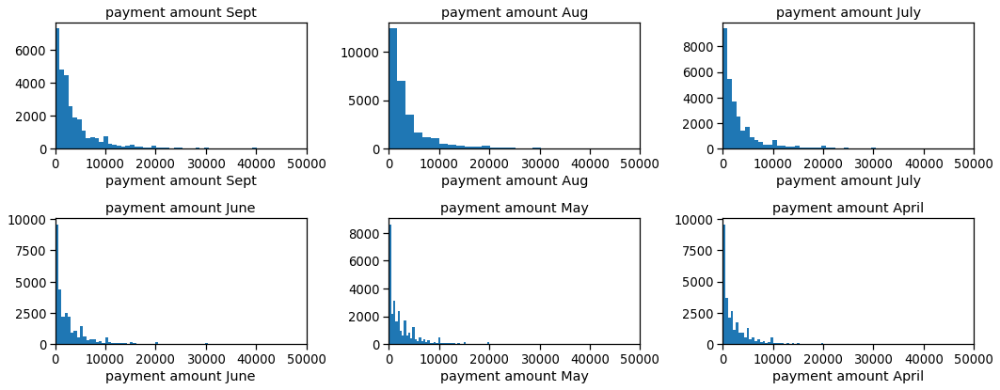

In [184]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 6))

axes[0, 0].hist(x = df['payment_amount_sept'], bins = 1000)
#axes[0, 0].set_xlabel('bill in April')
axes[0, 0].set_xlabel('payment amount Sept')
axes[0, 0].set_title('payment amount Sept')
axes[0, 0].set_xlim([0, 50000])

axes[0, 1].hist(x = df['payment_amount_aug'], bins = 1000)
#axes[0, 0].set_xlabel('bill in April')
axes[0, 1].set_xlabel('payment amount Aug')
axes[0, 1].set_title('payment amount Aug')
axes[0, 1].set_xlim([0, 50000])

axes[0, 2].hist(x = df['payment_amount_jul'], bins = 1000)
#axes[0, 0].set_xlabel('bill in April')
axes[0, 2].set_xlabel('payment amount July')
axes[0, 2].set_title('payment amount July')
axes[0, 2].set_xlim([0, 50000])

axes[1, 0].hist(x = df['payment_amount_jun'], bins = 1000)
#axes[0, 0].set_xlabel('bill in April')
axes[1, 0].set_xlabel('payment amount June')
axes[1, 0].set_title('payment amount June')
axes[1, 0].set_xlim([0, 50000])

axes[1, 1].hist(x = df['payment_amount_may'], bins = 1000)
#axes[0, 0].set_xlabel('bill in April')
axes[1, 1].set_xlabel('payment amount May')
axes[1, 1].set_title('payment amount May')
axes[1, 1].set_xlim([0, 50000])

axes[1, 2].hist(x = df['payment_amount_apr'], bins = 1000)
#axes[0, 0].set_xlabel('bill in April')
axes[1, 2].set_xlabel('payment amount April')
axes[1, 2].set_title('payment amount April')
axes[1, 2].set_xlim([0, 50000])

plt.tight_layout()

**At least 8000 customers pay less than 1,000 NTD or even 0 NTD** each month which align with the finding above. This is a **warning sign** that the **credit risk** is increasing as customers cannot pay their debts.

### Correlation Matrix

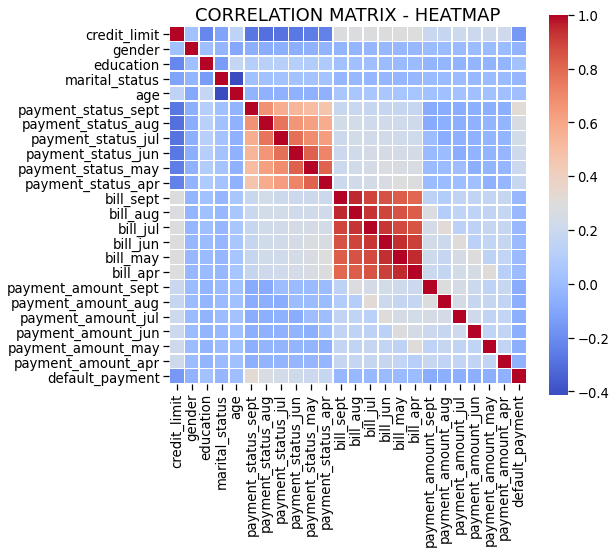

In [26]:
# Features correlation
corr = df.corr() # .corr is used to find corelation
f,ax = plt.subplots(figsize=(8, 7))
sns.heatmap(corr, cbar = True,  square = True, annot = False, fmt= '.1f', 
            xticklabels= True, yticklabels= True
            ,cmap="coolwarm", linewidths=.5, ax=ax)
plt.title('CORRELATION MATRIX - HEATMAP', size=18);

The variable "age" is inversely correlated with "marital_status".

The only feature with a notable positive correlation with the dependent variable ‘default_payment’ is repayment status during the last month (September). 

An interesting finding is that the **bill amounts** from April to September are **highly positively correlated** while the **payment amount** of each month are **slightly negatively correlated or even NOT correlated** to each other. This shows that the spending patterns/amounts are more or less the same each month but customers pay the bills of varies amounts, i.e. sometimes they may repay a higher amount than the previous months. This makes sense as around 10% of the customers repay their bills two months later where they may accumulated the debts. Also, **multicollinearity** exists between the payment status features.

Moreover, the bill amounts of each month are weakly positively correlated or even **NOT correlated** to the payment amount of the same month, meaning that the customers are not paying the exact amount of their bills. 

The payment status and credit limit are negatively correlated, i.e. the later the repayment, the lower the credit limit.

The **credit limit** is inversely correlated with the customer having a **default payment next month**.

### Further Exploration - Bivariate Analysis

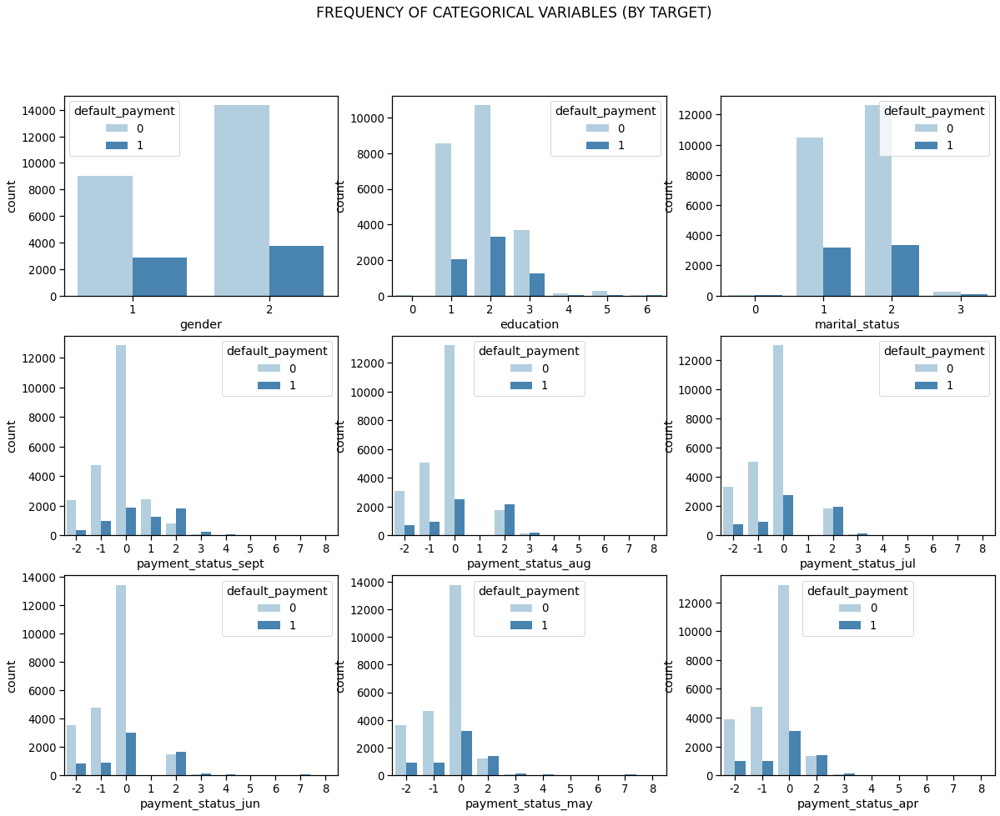

In [27]:
# Creating a new data frame with categorical variables

subset = df[['gender', 'education', 'marital_status', 'payment_status_sept','payment_status_aug',
             'payment_status_jul', 'payment_status_jun', 'payment_status_may', 'payment_status_apr','default_payment']]

f, axes = plt.subplots(3, 3, figsize=(20, 15), facecolor='white')
f.suptitle('FREQUENCY OF CATEGORICAL VARIABLES (BY TARGET)')
ax1 = sns.countplot(x="gender", hue="default_payment", data=subset, palette="Blues", ax=axes[0,0])
ax2 = sns.countplot(x="education", hue="default_payment", data=subset, palette="Blues",ax=axes[0,1])
ax3 = sns.countplot(x="marital_status", hue="default_payment", data=subset, palette="Blues",ax=axes[0,2])
ax4 = sns.countplot(x="payment_status_sept", hue="default_payment", data=subset, palette="Blues", ax=axes[1,0])
ax5 = sns.countplot(x="payment_status_aug", hue="default_payment", data=subset, palette="Blues", ax=axes[1,1])
ax6 = sns.countplot(x="payment_status_jul", hue="default_payment", data=subset, palette="Blues", ax=axes[1,2])
ax7 = sns.countplot(x="payment_status_jun", hue="default_payment", data=subset, palette="Blues", ax=axes[2,0])
ax8 = sns.countplot(x="payment_status_may", hue="default_payment", data=subset, palette="Blues", ax=axes[2,1])
ax9 = sns.countplot(x="payment_status_apr", hue="default_payment", data=subset, palette="Blues", ax=axes[2,2])

**Male** customers have a higher proportion of default payment than female customers.

There is **NO significant difference** in the proportion of default payment across differenct education levels. But clients who have lower than **high school level eductation** tend to have default payment more.

**Married** clients have a higher default payment rate than single or other marital status clients.

People who have the **payment delay for two months** have a **high ratio** of default next month (October). In **September**, a quarter of customers who repay one month later have default payment next month in October. This situation does not exist in other months as almost no one repay one month later.

## Feature Engineering
We will create **two dataset** to test the effect of turning numeric variables into categorical variables.  
The original dataset will keep the payment status as numeric variables whereas the modified dataset will fix the wrong lable of the payment status and turn the payment status into categorical variables.

In [28]:
# Variable 'education': group the categories 0, 4, 5, 6 into a single class '0' (others)
# as the document describes 
df['education']=np.where(df['education'] == 4, 0, df['education'])
df['education']=np.where(df['education'] == 5, 0, df['education'])
df['education']=np.where(df['education'] == 6, 0, df['education'])

In [29]:
## Fix the problem of no consumption customers having default payment next month
# Those 317 customers will be assigned 0 for the target variable 
df['default_payment'] = [ 0 if (df['bill_apr'][i] == 0) and (df['bill_may'][i] == 0) and (df['bill_jun'][i] == 0) and 
                        (df['bill_jul'][i] == 0) and (df['bill_aug'][i] == 0) and (df['bill_sept'][i] == 0) and 
                       (df['default_payment'][i] == 1)  else df['default_payment'][i] for i in range(df.shape[0])]
 

In [30]:
# Function to correct the payment status

def pay_status(bill_1, pay_amt_2,pay_status):

    
    if bill_1 == 0 and pay_amt_2 == 0 : # no consumption
        pay_status = -2
    elif bill_1 <=pay_amt_2 : # paid in full
        pay_status = -1
    elif pay_status == 0 : # the use of revolving credit
        pay_status = 0
    else: # all late payment move 1 month forward
        pay_status = pay_status -1 
      
    return pay_status

In [31]:
## Create a new data frame for modification of the payment status
df_new_feature = df.copy()

df_new_feature['pay_status_apr'] = df_new_feature.apply(lambda row : pay_status(row['bill_apr'],row['payment_amount_may'],row['payment_status_apr']), axis = 1)
df_new_feature['pay_status_may'] = df_new_feature.apply(lambda row : pay_status(row['bill_may'],row['payment_amount_jun'],row['payment_status_may']), axis = 1)
df_new_feature['pay_status_jun'] = df_new_feature.apply(lambda row : pay_status(row['bill_jun'],row['payment_amount_jul'],row['payment_status_jun']), axis = 1)
df_new_feature['pay_status_jul'] = df_new_feature.apply(lambda row : pay_status(row['bill_jul'],row['payment_amount_aug'],row['payment_status_jul']), axis = 1)
df_new_feature['pay_status_aug'] = df_new_feature.apply(lambda row : pay_status(row['bill_aug'],row['payment_amount_sept'],row['payment_status_aug']), axis = 1)


In [32]:
# Drop the old payment status for the new data frame

df_new_feature = df_new_feature.drop(['payment_status_sept','payment_status_aug','payment_status_jul',
                                    'payment_status_jun','payment_status_may','payment_status_apr'], axis = 1)
df_new_feature.head()

,credit_limit,gender,education,marital_status,age,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,payment_amount_sept,payment_amount_aug,payment_amount_jul,payment_amount_jun,payment_amount_may,payment_amount_apr,default_payment,pay_status_apr,pay_status_may,pay_status_jun,pay_status_jul,pay_status_aug
0,20000,2,2,1,24,3913,3102,689,0,0,0,0,689,0,0,0,0,1,-2,-2,-2,-1,1
1,120000,2,2,2,26,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,1,0,0,0,1
2,90000,2,2,2,34,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,0,0,0,0
3,50000,2,2,1,37,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,0,0,0,0
4,50000,1,2,1,57,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,0,0,0,-1,0


In [33]:
## Original data frame
# one hot encode all the categorical features

df[['gender','marital_status','education']] = df[['gender','marital_status','education']].astype('object')

#One Hot encoding
df = pd.get_dummies(df)
df.head()

,credit_limit,age,payment_status_sept,payment_status_aug,payment_status_jul,payment_status_jun,payment_status_may,payment_status_apr,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,payment_amount_sept,payment_amount_aug,payment_amount_jul,payment_amount_jun,payment_amount_may,payment_amount_apr,default_payment,gender_1,gender_2,education_0,education_1,education_2,education_3,marital_status_0,marital_status_1,marital_status_2,marital_status_3
0,20000,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0
1,120000,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,0,1,0,0,0,1,0
2,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,0,1,0,0,0,1,0
3,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,0,1,0,0,1,0,0
4,50000,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,1,0,0,0,1,0,0,1,0,0


In [34]:
## Data frame with modified payment status
# one hot encode all the categorical features

df_new_feature[['gender','marital_status','education','pay_status_apr','pay_status_may','pay_status_jun','pay_status_jul','pay_status_aug']] = df_new_feature[['gender','marital_status','education','pay_status_apr','pay_status_may','pay_status_jun','pay_status_jul','pay_status_aug']].astype('object')

#One Hot encoding
df_new_feature = pd.get_dummies(df_new_feature)
df_new_feature.head()

,credit_limit,age,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,payment_amount_sept,payment_amount_aug,payment_amount_jul,payment_amount_jun,payment_amount_may,payment_amount_apr,default_payment,gender_1,gender_2,education_0,education_1,education_2,education_3,marital_status_0,marital_status_1,marital_status_2,marital_status_3,...,pay_status_jun_5,pay_status_jun_6,pay_status_jun_7,pay_status_jul_-3,pay_status_jul_-2,pay_status_jul_-1,pay_status_jul_0,pay_status_jul_1,pay_status_jul_2,pay_status_jul_3,pay_status_jul_4,pay_status_jul_5,pay_status_jul_6,pay_status_jul_7,pay_status_aug_-3,pay_status_aug_-2,pay_status_aug_-1,pay_status_aug_0,pay_status_aug_1,pay_status_aug_2,pay_status_aug_3,pay_status_aug_4,pay_status_aug_5,pay_status_aug_6,pay_status_aug_7
0,20000,24,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,120000,26,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,90000,34,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,50000,37,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,50000,57,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


#### Train-Test Split & Sampling

3 ways for imbalanced classification problems:

A) Random Oversampling: Randomly duplicate examples in the minority class, which has the disadvantage of increasing the likelihood of overfitting since it replicates the minority class event.

B) Random Undersampling: Randomly delete examples in the majority class, which discard potentially useful information and the sample can be biased.

C) SMOTE: Synthetic Minority Oversampling Technique  

**Orginal dataset without changing the payment status:**

In [35]:
## Original data frame
# Split the df into train and test sets

X = df.drop(['default_payment'], axis=1)  
y = df['default_payment']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)

In [36]:
## Original data frame
# Create the training df by remerging X_train and y_train

df_train = X_train.join(y_train)

In [37]:
# Check the distribution of the samples in the train dataset

# Separate majority and minority classes
df_majority = df_train[df_train.default_payment == 0]
df_minority = df_train[df_train.default_payment == 1]

major_percent = df_majority.default_payment.count()/ df_train.shape[0]*100
minor_percent = df_minority.default_payment.count()/ df_train.shape[0]*100

print('Customers with No Default Payment Next Month :')
print(f'{df_majority.default_payment.count()}({round(major_percent,2)}%)')
print("-----------")
print('Customers with Default Payment Next Month :')
print(f'{df_minority.default_payment.count()}({round(minor_percent,2)}%)')
print("-----------")
# print(df_train.default_payment.value_counts())
# the imbalanced train dataset

Customers with No Default Payment Next Month :
16557(78.84%)
-----------
Customers with Default Payment Next Month :
4443(21.16%)
-----------


In [38]:
# A) Random Oversampling:

# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples = int(16557*0.8),    # to match majority class
                                 random_state= 42) # reproducible results
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
# Display new class counts
df_upsampled.default_payment.value_counts()

0    16557
1    13245
Name: default_payment, dtype: int64

In [39]:
# B) Random Undersampling:

# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=int(4443*2),     # to match minority class
                                 random_state=587) # reproducible results
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])
# Display new class counts
df_downsampled.default_payment.value_counts()

0    8886
1    4443
Name: default_payment, dtype: int64

In [40]:
# C) SMOTE: Synthetic Minority Oversampling Technique

sm = SMOTE(random_state=42)
X_SMOTE, y_SMOTE = sm.fit_sample(X_train, y_train)
print(len(y_SMOTE))
print(y_SMOTE.sum())

33114
16557


**Second Dataset with Payment Status Modified :**

In [41]:
## Data frame with modified payment status
# Split the df into train and test sets

X_nf = df_new_feature.drop(['default_payment'], axis=1)  
y_nf = df_new_feature['default_payment']

X_nf_train, X_nf_test, y_nf_train, y_nf_test = train_test_split(X_nf,y_nf, test_size=0.3, random_state=42)

In [42]:
## Data frame with modified payment status
# Create the training df by remerging X_train and y_train

df_nf_train = X_nf_train.join(y_nf_train)

In [43]:
# Check the distribution of the samples in the train dataset

# Separate majority and minority classes
df_nf_majority = df_nf_train[df_nf_train.default_payment == 0]
df_nf_minority = df_nf_train[df_nf_train.default_payment == 1]

major_nf_percent = df_nf_majority.default_payment.count()/ df_nf_train.shape[0]*100
minor_nf_percent = df_nf_minority.default_payment.count()/ df_nf_train.shape[0]*100

print('Customers with No Default Payment Next Month :')
print(f'{df_nf_majority.default_payment.count()}({round(major_nf_percent,2)}%)')
print("-----------")
print('Customers with Default Payment Next Month :')
print(f'{df_nf_minority.default_payment.count()}({round(minor_nf_percent,2)}%)')
print("-----------")

Customers with No Default Payment Next Month :
16557(78.84%)
-----------
Customers with Default Payment Next Month :
4443(21.16%)
-----------


In [44]:
# A) Random Oversampling:

# Upsample minority class
df_nf_minority_upsampled = resample(df_nf_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples = int(16557*0.8),    # to match majority class
                                 random_state= 42) # reproducible results
# Combine majority class with upsampled minority class
df_nf_upsampled = pd.concat([df_nf_majority, df_nf_minority_upsampled])
# Display new class counts
df_nf_upsampled.default_payment.value_counts()

0    16557
1    13245
Name: default_payment, dtype: int64

In [45]:
# B) Random Undersampling:

# Downsample majority class
df_nf_majority_downsampled = resample(df_nf_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=int(4443*2),     # to match minority class
                                 random_state=587) # reproducible results
# Combine minority class with downsampled majority class
df_nf_downsampled = pd.concat([df_nf_majority_downsampled, df_nf_minority])
# Display new class counts
df_nf_downsampled.default_payment.value_counts()

0    8886
1    4443
Name: default_payment, dtype: int64

In [46]:
# C) SMOTE: Synthetic Minority Oversampling Technique

sm = SMOTE(random_state=42)
X_nf_SMOTE, y_nf_SMOTE = sm.fit_sample(X_nf_train, y_nf_train)
print(len(y_nf_SMOTE))
print(y_nf_SMOTE.sum())

33114
16557


So we have 4 sets of training data:
1) The normal train data with unbalance
2) Train data with oversampling
3) Train data with undersampling
4) Train data with SMOTE algorithm


In [47]:
## Original Dataset
# List of training set with different sampling methods

xtrain_data = [X_train,df_upsampled.drop('default_payment',axis = 1),df_downsampled.drop('default_payment',axis = 1),X_SMOTE]
ytrain_data = [y_train,df_upsampled['default_payment'],df_downsampled['default_payment'],y_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']


In [48]:
## Modified Dataset
# List of training set with different sampling methods

xtrain_nf_data = [X_nf_train,df_nf_upsampled.drop('default_payment',axis = 1),df_nf_downsampled.drop('default_payment',axis = 1),X_nf_SMOTE]
ytrain_nf_data = [y_nf_train,df_nf_upsampled['default_payment'],df_nf_downsampled['default_payment'],y_nf_SMOTE]
name = ['Normal Sampling' , 'Over Sampling' , 'Under Sampling' , 'SMOTE']

## Predictive Models

#### Metric

For evaluation, we choose **recall** as the metric as we would like to predict which customers are likely to have default payment next month based on prudence --  we rather overestimate the potential loss/short of income flow than underestimate it in the perspective of **cash flow control** and **risk management**. We want to identify as many default customers as possible even though some of them are not actually defaulted. Recall is the ratio of True Positive over the sum of True Positive and False Negative which is the probability that we predict correctly.

In [49]:
# Define a function which evaluates the model with train and test score 
# and also performs a K-fold cross validation on the train dataset

def model_eval(algo, Xtrain,ytrain,Xtest,ytest):
    from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve,classification_report

    algo.fit(Xtrain,ytrain)
    y_pred = algo.predict(Xtrain)
    y_train_prob = algo.predict_proba(Xtrain)[:,1]

    #print('confusion matrix-train\n',confusion_matrix(ytrain,y_pred))
    print('Overall Train Accuracy',accuracy_score(ytrain,y_pred))
    print('Train AUC Score',roc_auc_score(ytrain,y_train_prob))
    print('Overall Train recall',recall_score(ytrain,y_pred))

    y_test_pred = algo.predict(Xtest)
    y_test_prob = algo.predict_proba(Xtest)[:,1]
        
    #print('confusion matrix-test\n',confusion_matrix(ytest,y_test_pred))
    print('Overall Test Accuracy',accuracy_score(ytest,y_test_pred))
    print('Test AUC Score',roc_auc_score(ytest,y_test_prob))
    print('Classification Report of Test\n',  classification_report(ytest, y_test_pred))
    
    
    kf = KFold(n_splits = 5,shuffle = True,random_state = 42)
    score=[]
    for train_idx,test_idx in kf.split(Xtrain,ytrain):
        xtrain_k,xtest_k = Xtrain.iloc[train_idx,:],Xtrain.iloc[test_idx,:]
        ytrain_k,ytest_k = ytrain.iloc[train_idx],ytrain.iloc[test_idx]
        algo.fit(xtrain_k,ytrain_k)
        y_pred_k = algo.predict(xtest_k)
        roc = roc_auc_score(ytest_k,y_pred_k)
        score.append(roc)
         
    print('K-Fold scores: %0.03f (+/- %0.5f)' % (np.mean(score),np.var(score,ddof=1)))
    
    f,ax =  plt.subplots(1,2,figsize=(14,6))
    #plt.figure(figsize=(6,4))
    ConfMatrix = confusion_matrix(ytest,y_test_pred)
    sns.heatmap(ConfMatrix,annot=True, cmap='YlGnBu', fmt="d", 
            xticklabels = ['Non-default', 'Default'], 
            yticklabels = ['Non-default', 'Default'],linewidths=.5,ax = ax[0])
    ax[0].set_ylabel('True label')
    ax[0].set_xlabel('Predicted label')
    ax[0].set_title('Confusion Matrix')

    global fpr,tpr,thresholds
    fpr,tpr,thresholds = roc_curve(ytest,y_test_prob)
    ax[1].plot(fpr,tpr,color = 'r')
    ax[1].plot(fpr,fpr,color = 'green')
    ax[1].set_ylabel('TPR')
    ax[1].set_xlabel('FPR')
    ax[1].set_title('ROC Curve')
    plt.show()

Model Building:

i) Logistic Regression

ii) Naive Bayes

iii) K-Nearest Neighbours

iv) Decision Tree

v) Random Forest

vi) AdaBoost Classifier

vii) GradientBoosting Classifier

viii) XGBoost Classifier

### i) Logistic Regression:

In [77]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    global best_log
    print('Data is ',sampleName)
    best_log = []
    # Setup the hyperparameter grid, (not scaled data)
    param_grid = {'C': np.logspace(-5, 8, num = 15)}
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    
    # Instantiate a logistic regression classifier
    logreg = LogisticRegression()
    # Instantiate the RandomizedSearchCV object
    logreg_cv = RandomizedSearchCV(logreg, param_grid ,scoring = 'recall', cv=5, random_state=0)
    # Fit it to the data
    logreg_cv.fit(standardized_Xtrain_df,ytrain)
    best_log.append(logreg_cv.best_params_)
    # Print the tuned parameters and score
    print("Tuned Logistic Regression Parameters: {}".format(logreg_cv.best_params_))
    print("_" * 100)

Data is  Normal Sampling
Tuned Logistic Regression Parameters: {'C': 3.727593720314938}
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Logistic Regression Parameters: {'C': 0.05179474679231213}
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Logistic Regression Parameters: {'C': 3.727593720314938}
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Logistic Regression Parameters: {'C': 0.0007196856730011522}
____________________________________________________________________________________________________


In [78]:
# Best Parameter of each Sampling Method

param_log =[{'C': 3.727593720314938},{'C': 0.05179474679231213},{'C': 3.727593720314938},{'C': 0.0007196856730011522}]

Data is  Normal Sampling  And with hyper parameter  {'C': 3.727593720314938}
Overall Train Accuracy 0.8206190476190476
Train AUC Score 0.740562733984758
Overall Train recall 0.2718883637182084
Overall Test Accuracy 0.8164444444444444
Test AUC Score 0.732380424619503
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.97      0.89      7124
           1       0.66      0.25      0.36      1876

    accuracy                           0.82      9000
   macro avg       0.74      0.61      0.63      9000
weighted avg       0.79      0.82      0.78      9000

K-Fold scores: 0.620 (+/- 0.00007)


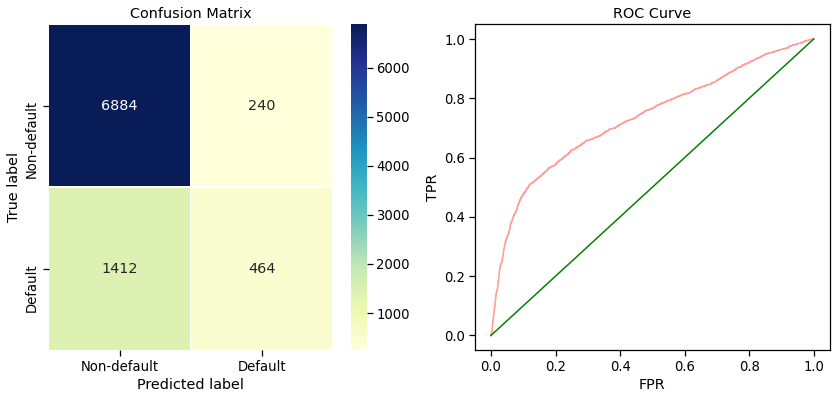

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'C': 0.05179474679231213}
Overall Train Accuracy 0.7230387222334071
Train AUC Score 0.7409009903511652
Overall Train recall 0.5428463571158928
Overall Test Accuracy 0.7868888888888889
Test AUC Score 0.7315834699128086
Classification Report of Test
               precision    recall  f1-score   support

           0       0.87      0.86      0.86      7124
           1       0.49      0.51      0.50      1876

    accuracy                           0.79      9000
   macro avg       0.68      0.69      0.68      9000
weighted avg       0.79      0.79      0.79      9000

K-Fold scores: 0.704 (+/- 0.00003)


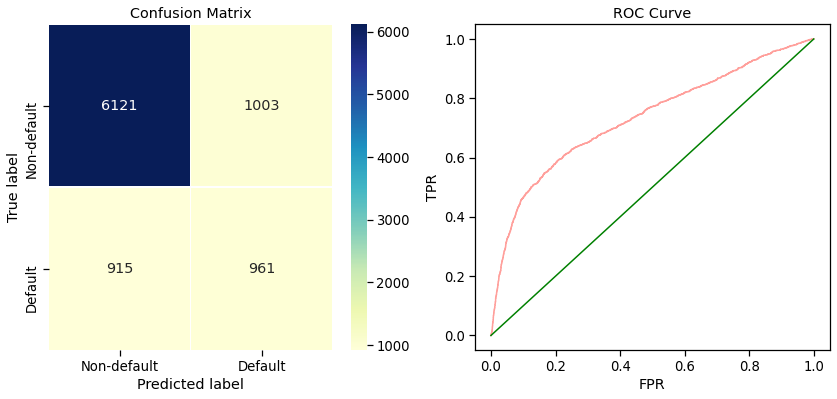

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'C': 3.727593720314938}
Overall Train Accuracy 0.763973291319679
Train AUC Score 0.7395730671887675
Overall Train recall 0.43866756695926173
Overall Test Accuracy 0.8181111111111111
Test AUC Score 0.7328699258579964
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.93      0.89      7124
           1       0.59      0.41      0.49      1876

    accuracy                           0.82      9000
   macro avg       0.72      0.67      0.69      9000
weighted avg       0.80      0.82      0.81      9000

K-Fold scores: 0.680 (+/- 0.00011)


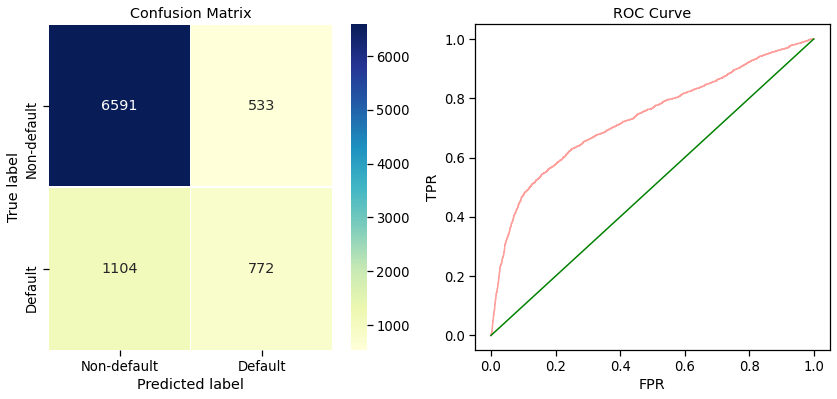

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'C': 0.0007196856730011522}
Overall Train Accuracy 0.8512109681705623
Train AUC Score 0.901414003910179
Overall Train recall 0.7739324756900404
Overall Test Accuracy 0.8181111111111111
Test AUC Score 0.7278421001593461
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.93      0.89      7124
           1       0.59      0.40      0.48      1876

    accuracy                           0.82      9000
   macro avg       0.72      0.66      0.68      9000
weighted avg       0.80      0.82      0.80      9000

K-Fold scores: 0.849 (+/- 0.00004)


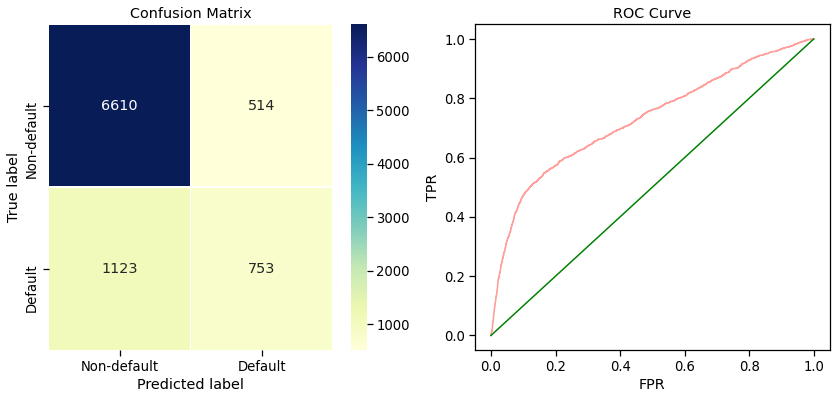

____________________________________________________________


In [79]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ', param_log[index])
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    standardized_Xtest = ss.transform(X_test)
    model_eval(LogisticRegression(**param_log[index],random_state= 42), standardized_Xtrain_df ,ytrain ,standardized_Xtest,y_test)
    print("_" * 60)
    



In [80]:
## Modified Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    global best_log
    print('Data is ',sampleName)
    best_log = []
    # Setup the hyperparameter grid, (not scaled data)
    param_grid = {'C': np.logspace(-5, 8, num = 15)}
    
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    
    # Instantiate a logistic regression classifier
    logreg = LogisticRegression()
    # Instantiate the RandomizedSearchCV object
    logreg_cv = RandomizedSearchCV(logreg, param_grid ,scoring = 'recall', cv=5, random_state=0)
    # Fit it to the data
    logreg_cv.fit(Xtrain,ytrain)
    best_log.append(logreg_cv.best_params_)
    # Print the tuned parameters and score
    print("Tuned Logistic Regression Parameters: {}".format(logreg_cv.best_params_))
    print("_" * 100)

Data is  Normal Sampling
Tuned Logistic Regression Parameters: {'C': 0.0007196856730011522}
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Logistic Regression Parameters: {'C': 268.2695795279727}
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Logistic Regression Parameters: {'C': 8.483428982440725e-05}
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Logistic Regression Parameters: {'C': 0.0007196856730011522}
____________________________________________________________________________________________________


In [81]:
# Best Parameter of each Sampling Method

param_log =[{'C': 0.0007196856730011522},{'C': 268.2695795279727},{'C': 8.483428982440725e-05},{'C': 0.0007196856730011522}]

Data is  Normal Sampling  And with hyper parameter  {'C': 0.0007196856730011522}
Overall Train Accuracy 0.8143809523809524
Train AUC Score 0.7485569429017139
Overall Train recall 0.24960612198964663
Overall Test Accuracy 0.8107777777777778
Test AUC Score 0.7319012491484983
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.97      0.89      7124
           1       0.63      0.22      0.33      1876

    accuracy                           0.81      9000
   macro avg       0.73      0.59      0.61      9000
weighted avg       0.78      0.81      0.77      9000

K-Fold scores: 0.603 (+/- 0.00007)


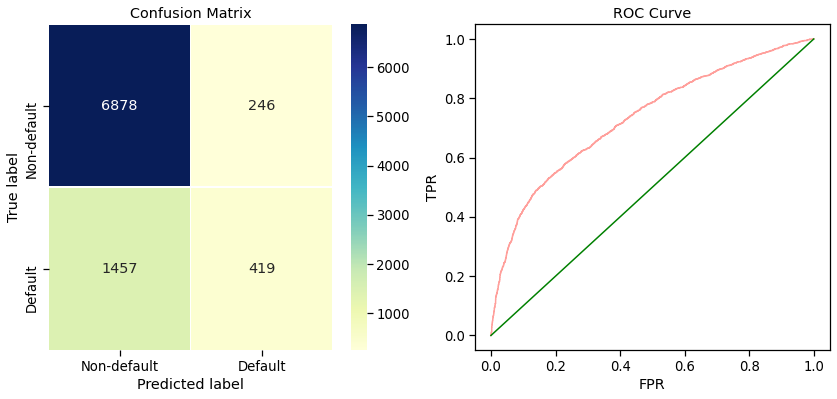

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'C': 268.2695795279727}
Overall Train Accuracy 0.7035769411448896
Train AUC Score 0.7556747543798557
Overall Train recall 0.47429218573046433
Overall Test Accuracy 0.791
Test AUC Score 0.7290678735144362
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.88      0.87      7124
           1       0.50      0.45      0.47      1876

    accuracy                           0.79      9000
   macro avg       0.68      0.66      0.67      9000
weighted avg       0.78      0.79      0.79      9000

K-Fold scores: 0.680 (+/- 0.00002)


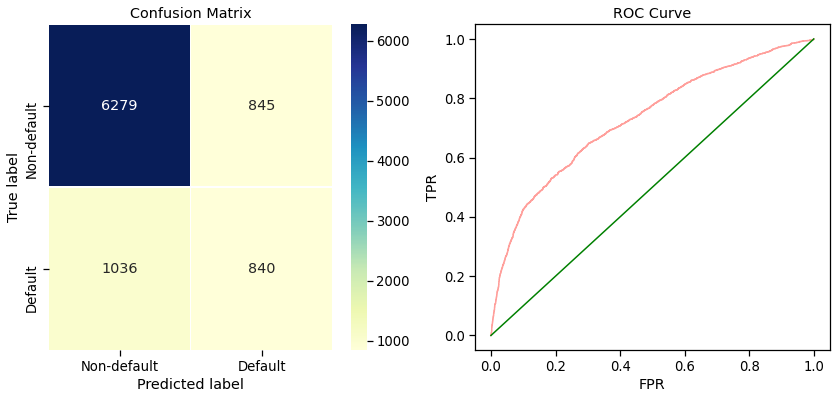

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'C': 8.483428982440725e-05}
Overall Train Accuracy 0.7210593442868932
Train AUC Score 0.7396059695093005
Overall Train recall 0.23340085527796534
Overall Test Accuracy 0.8086666666666666
Test AUC Score 0.7262958538900908
Classification Report of Test
               precision    recall  f1-score   support

           0       0.82      0.97      0.89      7124
           1       0.62      0.21      0.32      1876

    accuracy                           0.81      9000
   macro avg       0.72      0.59      0.60      9000
weighted avg       0.78      0.81      0.77      9000

K-Fold scores: 0.586 (+/- 0.00005)


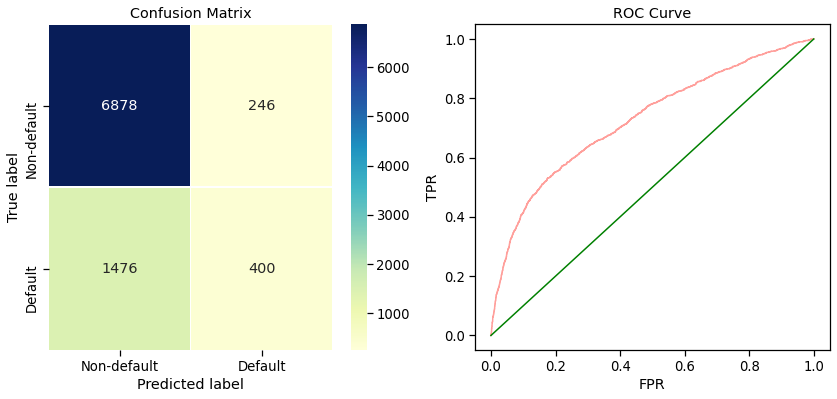

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'C': 0.0007196856730011522}
Overall Train Accuracy 0.8616597209639427
Train AUC Score 0.9203503207656478
Overall Train recall 0.7847436129733647
Overall Test Accuracy 0.8098888888888889
Test AUC Score 0.7281229909648039
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.94      0.89      7124
           1       0.58      0.33      0.42      1876

    accuracy                           0.81      9000
   macro avg       0.71      0.63      0.65      9000
weighted avg       0.79      0.81      0.79      9000

K-Fold scores: 0.859 (+/- 0.00002)


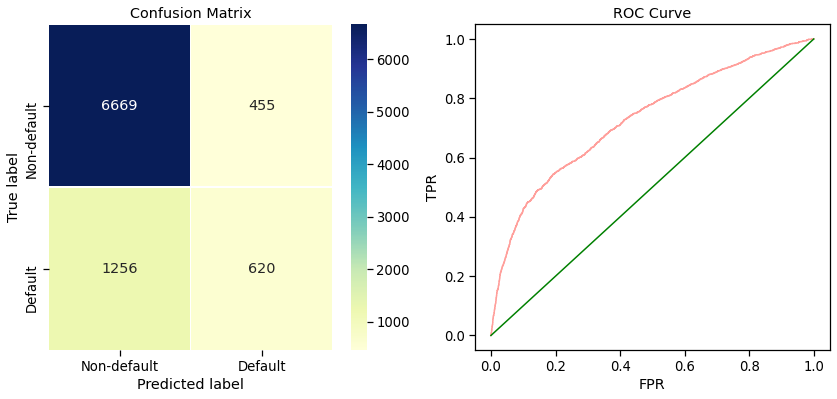

____________________________________________________________


In [82]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_nf_data,ytrain_nf_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ', param_log[index])
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    standardized_Xtest = ss.transform(X_nf_test)
    model_eval(LogisticRegression(**param_log[index],random_state= 42), standardized_Xtrain_df ,ytrain ,standardized_Xtest,y_nf_test)
    print("_" * 60)


Logistic regression is not a good model in this case as multicollinearity exists among the payment status of each month.

### ii) Naive Bayes

Data is  Normal Sampling
Overall Train Accuracy 0.6140476190476191
Train AUC Score 0.7394096979869609
Overall Train recall 0.7402655863155525
Overall Test Accuracy 0.6043333333333333
Test AUC Score 0.7288822715850443
Classification Report of Test
               precision    recall  f1-score   support

           0       0.89      0.57      0.70      7124
           1       0.31      0.72      0.43      1876

    accuracy                           0.60      9000
   macro avg       0.60      0.65      0.56      9000
weighted avg       0.77      0.60      0.64      9000

K-Fold scores: 0.655 (+/- 0.00060)


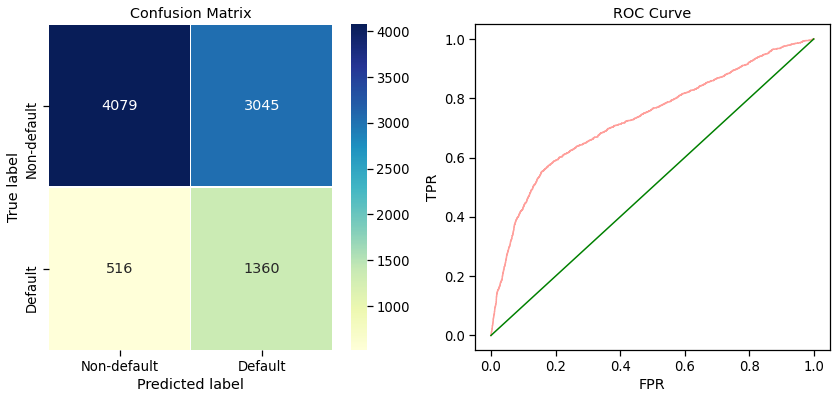

____________________________________________________________
Data is  Over Sampling
Overall Train Accuracy 0.5838869874505067
Train AUC Score 0.738440941394375
Overall Train recall 0.8224235560588902
Overall Test Accuracy 0.47988888888888886
Test AUC Score 0.7260516270416586
Classification Report of Test
               precision    recall  f1-score   support

           0       0.89      0.39      0.54      7124
           1       0.26      0.82      0.40      1876

    accuracy                           0.48      9000
   macro avg       0.58      0.60      0.47      9000
weighted avg       0.76      0.48      0.51      9000

K-Fold scores: 0.608 (+/- 0.00002)


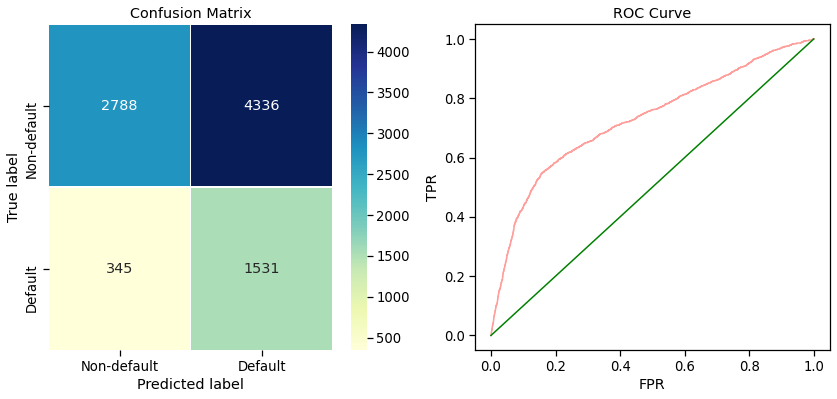

____________________________________________________________
Data is  Under Sampling
Overall Train Accuracy 0.5903668692325006
Train AUC Score 0.7376026006561518
Overall Train recall 0.7744767049291019
Overall Test Accuracy 0.5495555555555556
Test AUC Score 0.7294728605907657
Classification Report of Test
               precision    recall  f1-score   support

           0       0.89      0.49      0.63      7124
           1       0.28      0.77      0.42      1876

    accuracy                           0.55      9000
   macro avg       0.59      0.63      0.52      9000
weighted avg       0.76      0.55      0.59      9000

K-Fold scores: 0.633 (+/- 0.00043)


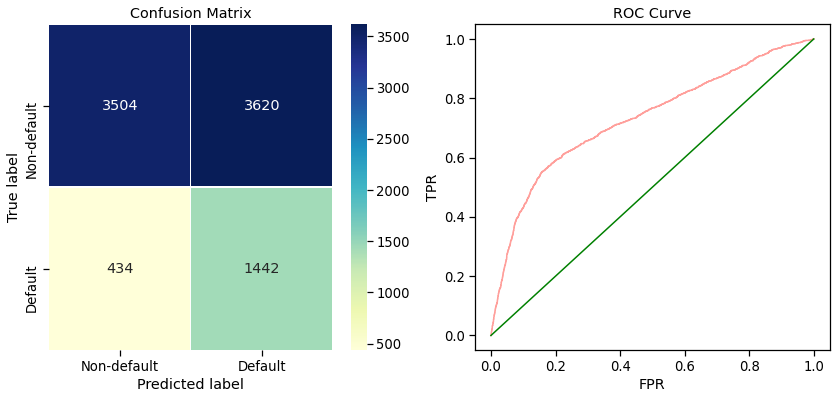

____________________________________________________________
Data is  SMOTE
Overall Train Accuracy 0.5963036782025729
Train AUC Score 0.7982896401974202
Overall Train recall 0.9423204686839404
Overall Test Accuracy 0.383
Test AUC Score 0.7115294077858082
Classification Report of Test
               precision    recall  f1-score   support

           0       0.90      0.25      0.39      7124
           1       0.24      0.89      0.38      1876

    accuracy                           0.38      9000
   macro avg       0.57      0.57      0.38      9000
weighted avg       0.76      0.38      0.39      9000

K-Fold scores: 0.596 (+/- 0.00001)


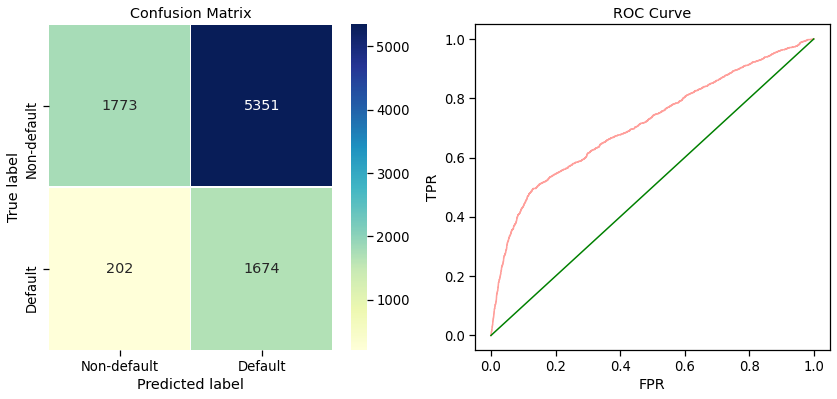

____________________________________________________________


In [131]:
## Original Dataset

# Result of each Sampling Method
index = [0,1,2,3]
for Xtrain,ytrain,sampleName,i in zip(xtrain_data,ytrain_data,name, index):
    print('Data is ',sampleName)
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    standardized_Xtest = ss.transform(X_test)
    model_eval(GaussianNB(), standardized_Xtrain_df,ytrain,standardized_Xtest,y_test)
    print("_" * 60)
    


Data is  Normal Sampling
Overall Train Accuracy 0.7968571428571428
Train AUC Score 0.7149396030607936
Overall Train recall 0.09903218546027459
Overall Test Accuracy 0.7983333333333333
Test AUC Score 0.705852779696608
Classification Report of Test
               precision    recall  f1-score   support

           0       0.81      0.98      0.89      7124
           1       0.60      0.10      0.17      1876

    accuracy                           0.80      9000
   macro avg       0.70      0.54      0.53      9000
weighted avg       0.76      0.80      0.74      9000

K-Fold scores: 0.559 (+/- 0.00054)


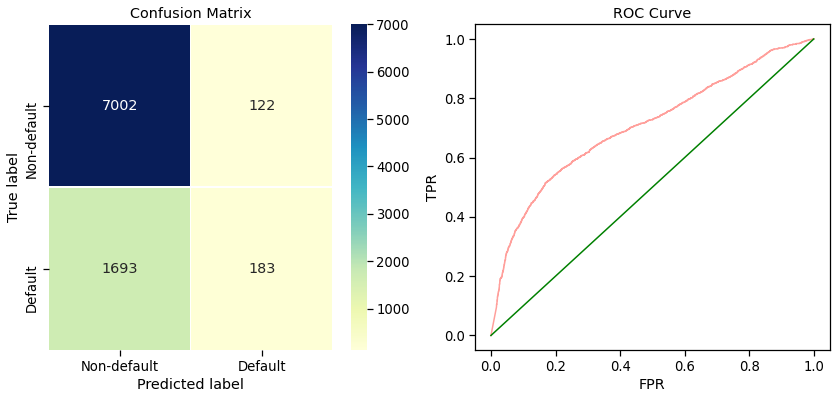

____________________________________________________________
Data is  Over Sampling
Overall Train Accuracy 0.6271391181799879
Train AUC Score 0.716159951962965
Overall Train recall 0.1935824839562099
Overall Test Accuracy 0.8078888888888889
Test AUC Score 0.7035003004947987
Classification Report of Test
               precision    recall  f1-score   support

           0       0.82      0.97      0.89      7124
           1       0.63      0.18      0.29      1876

    accuracy                           0.81      9000
   macro avg       0.73      0.58      0.59      9000
weighted avg       0.78      0.81      0.76      9000

K-Fold scores: 0.581 (+/- 0.00075)


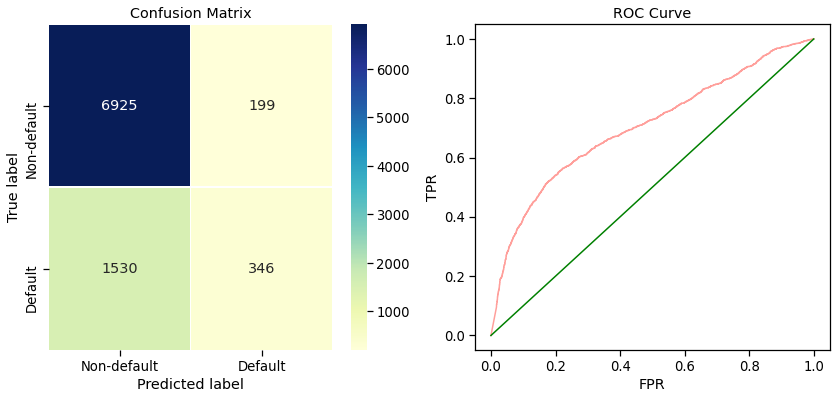

____________________________________________________________
Data is  Under Sampling
Overall Train Accuracy 0.7048540775752119
Train AUC Score 0.7129368276965504
Overall Train recall 0.16520369119963987
Overall Test Accuracy 0.8051111111111111
Test AUC Score 0.7058175374032221
Classification Report of Test
               precision    recall  f1-score   support

           0       0.82      0.97      0.89      7124
           1       0.62      0.16      0.26      1876

    accuracy                           0.81      9000
   macro avg       0.72      0.57      0.57      9000
weighted avg       0.78      0.81      0.76      9000

K-Fold scores: 0.564 (+/- 0.00139)


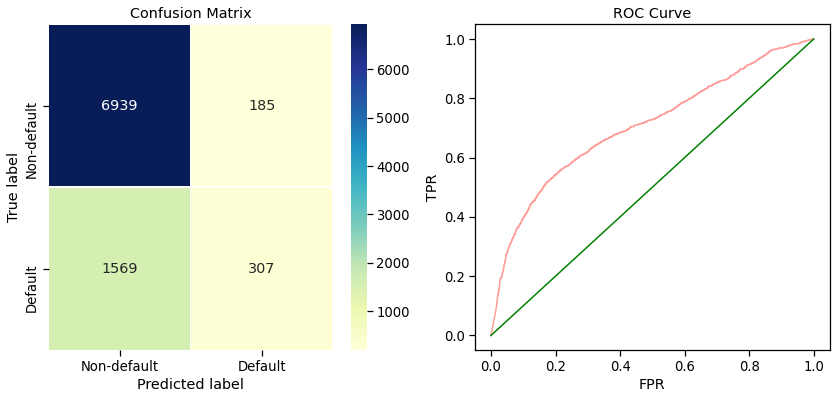

____________________________________________________________
Data is  SMOTE
Overall Train Accuracy 0.5962734794950776
Train AUC Score 0.7777515989984892
Overall Train recall 0.25566225765537237
Overall Test Accuracy 0.8076666666666666
Test AUC Score 0.6854901043231744
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.93      0.88      7124
           1       0.57      0.33      0.42      1876

    accuracy                           0.81      9000
   macro avg       0.70      0.63      0.65      9000
weighted avg       0.78      0.81      0.79      9000

K-Fold scores: 0.624 (+/- 0.00710)


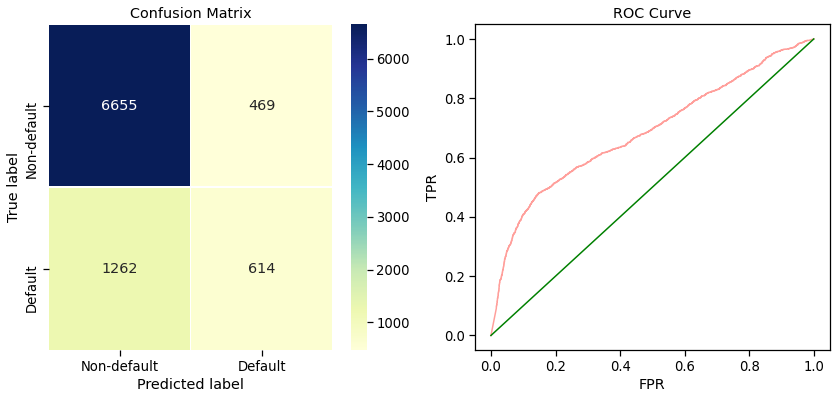

____________________________________________________________


In [130]:
## Modified Dataset

# Result of each Sampling Method

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    print('Data is ',sampleName)
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    standardized_Xtest = ss.transform(X_nf_test)
    model_eval(GaussianNB(), standardized_Xtrain_df,ytrain,standardized_Xtest,y_nf_test)
    print("_" * 60)
    


So far Naive Bayes is the **best model** in terms of **recall of class 1** in this case. We can see that it performs well with SMOTE sampling method of the original dataset(i.e. payment status are continuous variable) but its performances are terrible with the modified dataset(i.e. payment status are categorical variable) because of the assumptions of the model:

Naive Bayes model's perfomance is not good in this case as our case cannot satisfy one of the assumption of Naive Bayes model: **assumption of independent predictors**. The model implicitly assumes that all the attributes are mutually independent but our payment status are positively correlated to each other. On the other hand, **Zero Frequency** may happen when categorical variable has a category is not observed in training data set but in the test set, then model will assign a 0 (zero) probability and will be unable to make a prediction. In short, Naive Bayes **does not work well with categorical variables.**

### iii) K-Nearest Neighbours:

In [132]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    global best_knn
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain ,columns = Xtrain.columns)
    best_knn = []
    print('Data is ', sampleName) # Instantiate a KNN classifier: tree
    knn = KNeighborsClassifier()
    # Setup the parameters and distributions to sample from: param_dist
    params = {'n_neighbors' : sp_randint(1,20),
             'p': sp_randint(1,5)}
    rsearch_knn = RandomizedSearchCV(knn, param_distributions = params, cv = 3, random_state = 3 , n_iter = 50,n_jobs = -1)
    rsearch_knn.fit(standardized_Xtrain_df, ytrain)
    best_knn.append(rsearch_knn.best_params_)
    print("Tuned KNN Parameters: {}".format(rsearch_knn.best_params_), "for", sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned KNN Parameters: {'n_neighbors': 17, 'p': 4} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned KNN Parameters: {'n_neighbors': 1, 'p': 4} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned KNN Parameters: {'n_neighbors': 19, 'p': 3} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned KNN Parameters: {'n_neighbors': 2, 'p': 1} for SMOTE
____________________________________________________________________________________________________


In [134]:
# Best Parameter of each Sampling Method

param_knn = [{'n_neighbors': 17, 'p': 4},{'n_neighbors': 1, 'p': 4},{'n_neighbors': 19, 'p': 3},{'n_neighbors': 2, 'p': 1}]

Data is  Normal Sampling  And with hyper parameter  {'n_neighbors': 17, 'p': 4}
Overall Train Accuracy 0.8328571428571429
Train AUC Score 0.8259853074282119
Overall Train recall 0.35584064821066846
Overall Test Accuracy 0.8187777777777778
Test AUC Score 0.7290240638270108
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.95      0.89      7124
           1       0.63      0.31      0.42      1876

    accuracy                           0.82      9000
   macro avg       0.74      0.63      0.66      9000
weighted avg       0.80      0.82      0.79      9000

K-Fold scores: 0.642 (+/- 0.00006)


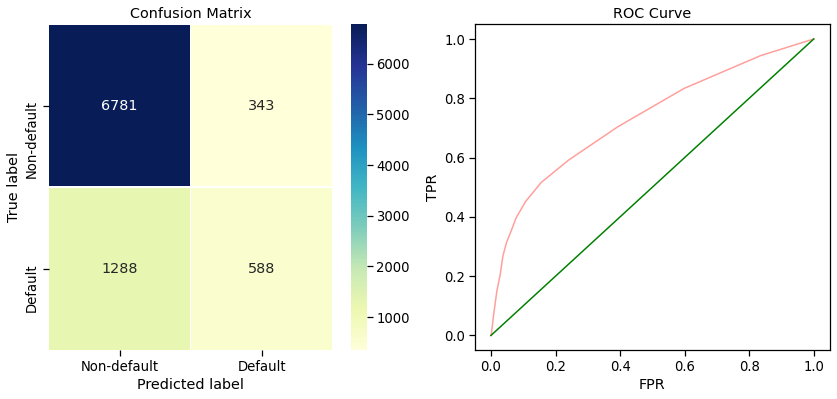

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'n_neighbors': 1, 'p': 4}
Overall Train Accuracy 1.0
Train AUC Score 1.0
Overall Train recall 1.0
Overall Test Accuracy 0.7496666666666667
Test AUC Score 0.6125483215988717
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.85      0.84      7124
           1       0.39      0.38      0.39      1876

    accuracy                           0.75      9000
   macro avg       0.62      0.61      0.61      9000
weighted avg       0.75      0.75      0.75      9000

K-Fold scores: 0.886 (+/- 0.00005)


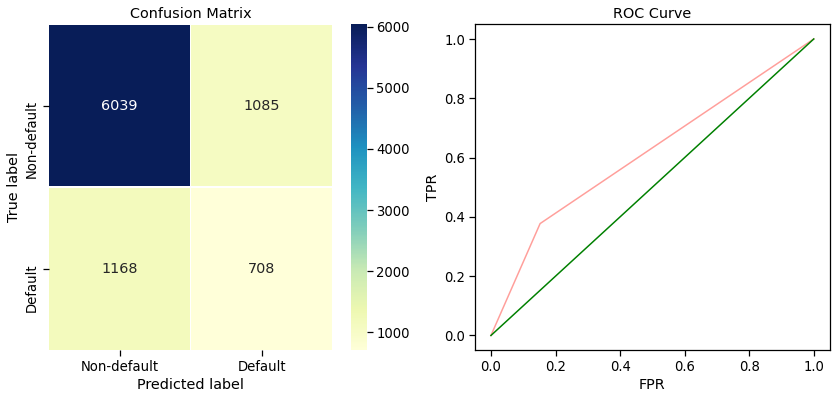

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'n_neighbors': 19, 'p': 3}
Overall Train Accuracy 0.7677995348488259
Train AUC Score 0.8068668738677004
Overall Train recall 0.4463200540175557
Overall Test Accuracy 0.8127777777777778
Test AUC Score 0.7290104831980309
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.92      0.89      7124
           1       0.57      0.40      0.47      1876

    accuracy                           0.81      9000
   macro avg       0.71      0.66      0.68      9000
weighted avg       0.79      0.81      0.80      9000

K-Fold scores: 0.672 (+/- 0.00005)


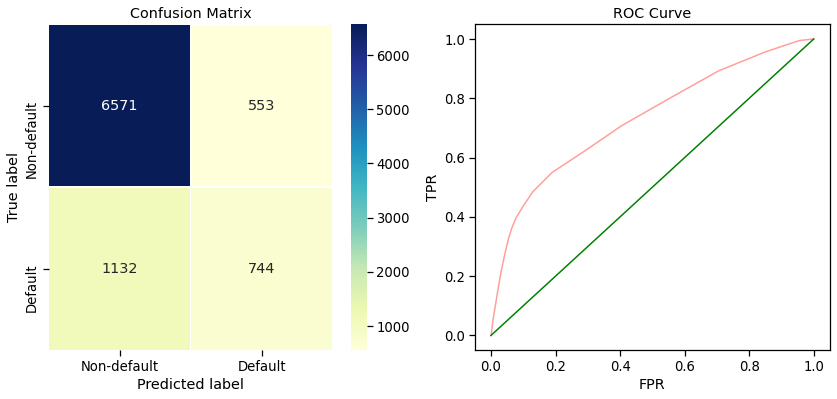

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'n_neighbors': 2, 'p': 1}
Overall Train Accuracy 0.9348915866400918
Train AUC Score 0.9886275574417555
Overall Train recall 0.8697831732801836
Overall Test Accuracy 0.7872222222222223
Test AUC Score 0.6569899759245005
Classification Report of Test
               precision    recall  f1-score   support

           0       0.82      0.93      0.87      7124
           1       0.48      0.23      0.31      1876

    accuracy                           0.79      9000
   macro avg       0.65      0.58      0.59      9000
weighted avg       0.75      0.79      0.76      9000

K-Fold scores: 0.859 (+/- 0.00001)


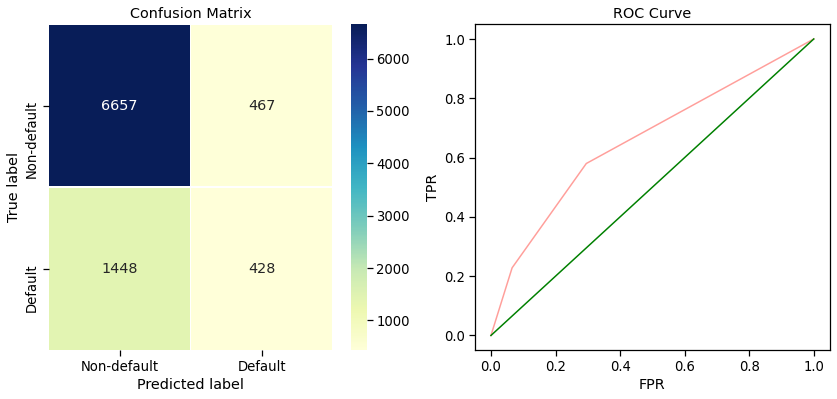

____________________________________________________________


In [135]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index  in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_knn[index])
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    standardized_Xtest = ss.transform(X_test)
    model_eval(KNeighborsClassifier(**param_knn[index]), standardized_Xtrain_df,ytrain, standardized_Xtest,y_test)
    print("_" * 60)
    
    


In [141]:
## Modified Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    global best_knn
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain ,columns = Xtrain.columns)
    best_knn = []
    print('Data is ', sampleName) # Instantiate a KNN classifier: tree
    knn = KNeighborsClassifier()
    # Setup the parameters and distributions to sample from: param_dist
    params = {'n_neighbors' : sp_randint(1,20),
             'p': sp_randint(1,5)}
    rsearch_knn = RandomizedSearchCV(knn, param_distributions = params, cv = 3, random_state = 3 , n_iter = 50,n_jobs = -1)
    rsearch_knn.fit(standardized_Xtrain_df, ytrain)
    best_knn.append(rsearch_knn.best_params_)
    print("Tuned KNN Parameters: {}".format(rsearch_knn.best_params_), "for", sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned KNN Parameters: {'n_neighbors': 18, 'p': 3} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned KNN Parameters: {'n_neighbors': 1, 'p': 4} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned KNN Parameters: {'n_neighbors': 18, 'p': 2} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned KNN Parameters: {'n_neighbors': 2, 'p': 1} for SMOTE
____________________________________________________________________________________________________


In [50]:
# Best Parameter of each Sampling Method

param_knn = [{'n_neighbors': 18, 'p': 3},{'n_neighbors': 1, 'p': 4},{'n_neighbors': 18, 'p': 1},{'n_neighbors': 2, 'p': 1}]

Data is  Normal Sampling  And with hyper parameter  {'n_neighbors': 18, 'p': 3}
Overall Train Accuracy 0.8208095238095238
Train AUC Score 0.8035153076317116
Overall Train recall 0.29214494710781
Overall Test Accuracy 0.8083333333333333
Test AUC Score 0.7084264772432056
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.96      0.89      7124
           1       0.60      0.25      0.35      1876

    accuracy                           0.81      9000
   macro avg       0.71      0.60      0.62      9000
weighted avg       0.78      0.81      0.78      9000

K-Fold scores: 0.617 (+/- 0.00007)


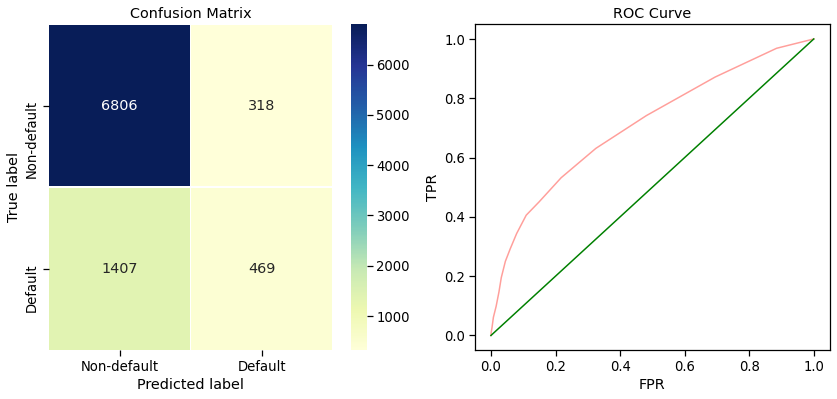

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'n_neighbors': 1, 'p': 4}
Overall Train Accuracy 1.0
Train AUC Score 1.0
Overall Train recall 1.0
Overall Test Accuracy 0.7298888888888889
Test AUC Score 0.5806177562496334
Classification Report of Test
               precision    recall  f1-score   support

           0       0.82      0.84      0.83      7124
           1       0.34      0.32      0.33      1876

    accuracy                           0.73      9000
   macro avg       0.58      0.58      0.58      9000
weighted avg       0.72      0.73      0.73      9000

K-Fold scores: 0.876 (+/- 0.00002)


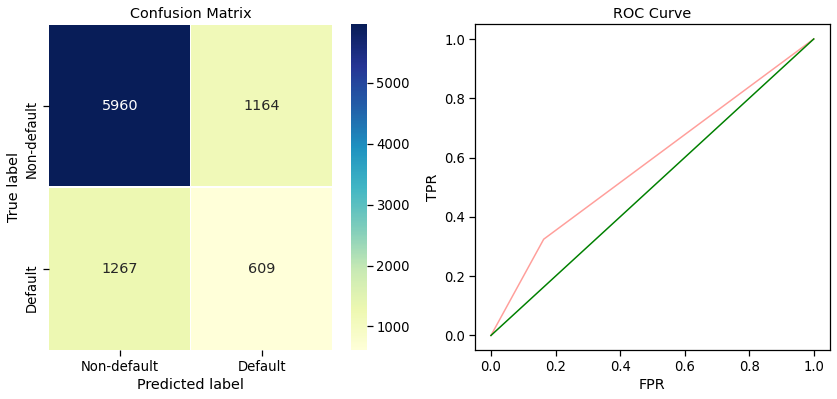

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'n_neighbors': 18, 'p': 1}
Overall Train Accuracy 0.7519693900517668
Train AUC Score 0.7916577951980242
Overall Train recall 0.41255908170155303
Overall Test Accuracy 0.7986666666666666
Test AUC Score 0.71283816140282
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.91      0.88      7124
           1       0.52      0.38      0.44      1876

    accuracy                           0.80      9000
   macro avg       0.69      0.64      0.66      9000
weighted avg       0.78      0.80      0.79      9000

K-Fold scores: 0.649 (+/- 0.00005)


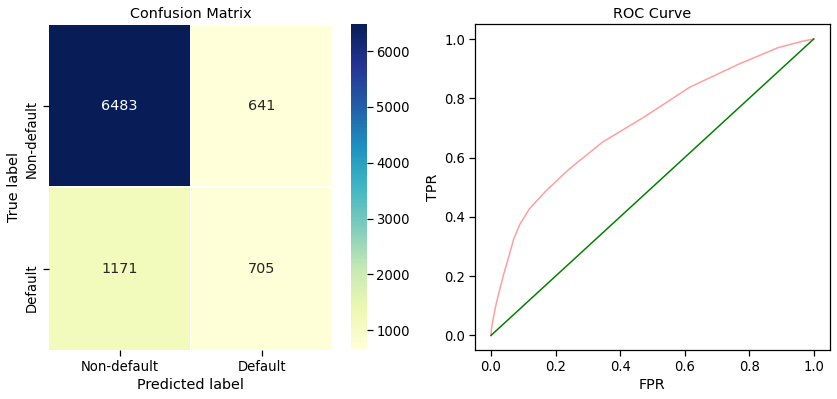

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'n_neighbors': 2, 'p': 1}
Overall Train Accuracy 0.923929455819291
Train AUC Score 0.986092556789575
Overall Train recall 0.8478589116385818
Overall Test Accuracy 0.7835555555555556
Test AUC Score 0.6273801268183827
Classification Report of Test
               precision    recall  f1-score   support

           0       0.81      0.94      0.87      7124
           1       0.45      0.18      0.25      1876

    accuracy                           0.78      9000
   macro avg       0.63      0.56      0.56      9000
weighted avg       0.74      0.78      0.74      9000

K-Fold scores: 0.859 (+/- 0.00001)


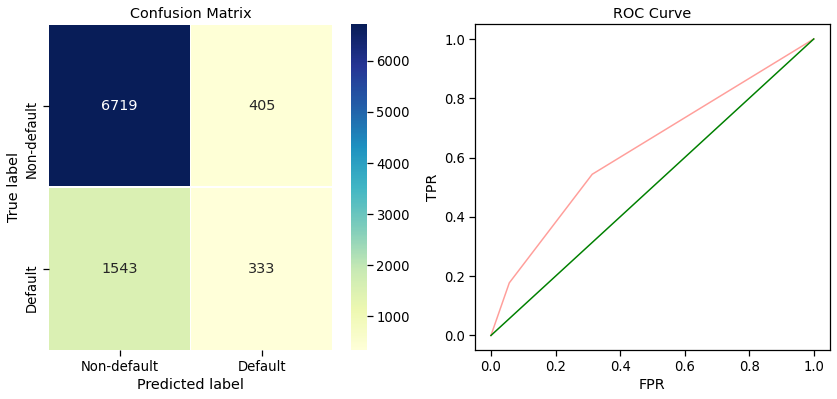

____________________________________________________________


In [51]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index  in zip(xtrain_nf_data,ytrain_nf_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_knn[index])
    ss = StandardScaler()
    standardized_Xtrain = ss.fit_transform(Xtrain)
    standardized_Xtrain_df = pd.DataFrame(standardized_Xtrain,columns = Xtrain.columns)
    standardized_Xtest = ss.transform(X_nf_test)
    model_eval(KNeighborsClassifier(**param_knn[index]), standardized_Xtrain_df,ytrain, standardized_Xtest,y_nf_test)
    print("_" * 60)
    
    


### iv) Decision Tree

In [83]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    print('Data is ',sampleName)
    # Instantiate a Decision Tree classifier: tree
    dtc = DecisionTreeClassifier(random_state = 42)

    # Setup the parameters and distributions to sample from: param_dist
    params = {'max_depth': sp_randint(2,20),
             'min_samples_leaf':sp_randint(1,20),
             'min_samples_split':sp_randint(2,40),
             'criterion':['gini','entropy']}

    # Instantiate the RandomizedSearchCV object: tree_cv
    rsearch_dt = RandomizedSearchCV(dtc, param_distributions= params, cv = 5, scoring = 'recall',n_iter = 100,n_jobs = -1)

    # Fit it to the data
    rsearch_dt.fit(Xtrain, ytrain)
    print("Tuned Decision Tree Parameters: {}".format(rsearch_dt.best_params_), "for",sampleName)
    print("_" * 100) 

Data is  Normal Sampling
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 19, 'min_samples_split': 19} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 1, 'min_samples_split': 5} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 7, 'min_samples_split': 39} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 29} for SMOTE
______________________________________________________________

In [84]:
# Best Parameter of each Sampling Method

param_dt = [{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 19, 'min_samples_split': 19},
               {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 1, 'min_samples_split': 5},
               {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 7, 'min_samples_split': 39},
               {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 29}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 19, 'min_samples_split': 19}
Overall Train Accuracy 0.8355238095238096
Train AUC Score 0.7683263231958251
Overall Train recall 0.41368444744541977
Overall Test Accuracy 0.8276666666666667
Test AUC Score 0.7512369221910021
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.94      0.90      7124
           1       0.65      0.38      0.48      1876

    accuracy                           0.83      9000
   macro avg       0.75      0.66      0.69      9000
weighted avg       0.81      0.83      0.81      9000

K-Fold scores: 0.667 (+/- 0.00004)


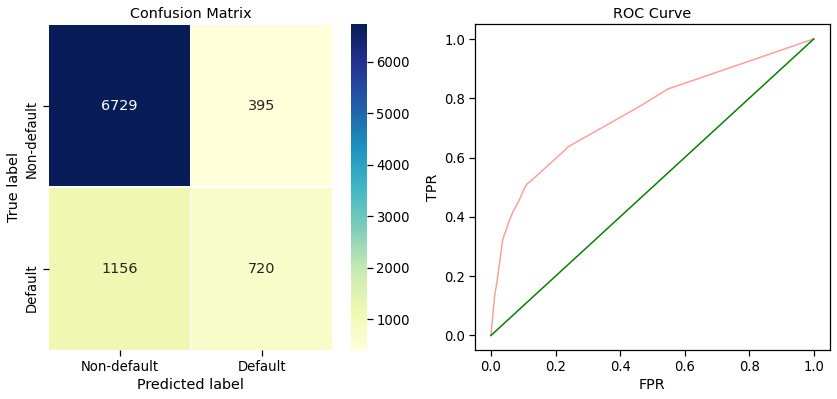

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 1, 'min_samples_split': 5}
Overall Train Accuracy 0.9450708006174082
Train AUC Score 0.9903101843881323
Overall Train recall 0.9423178557946394
Overall Test Accuracy 0.7467777777777778
Test AUC Score 0.6312451064841031
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.83      0.84      7124
           1       0.40      0.45      0.42      1876

    accuracy                           0.75      9000
   macro avg       0.63      0.64      0.63      9000
weighted avg       0.76      0.75      0.75      9000

K-Fold scores: 0.828 (+/- 0.00002)


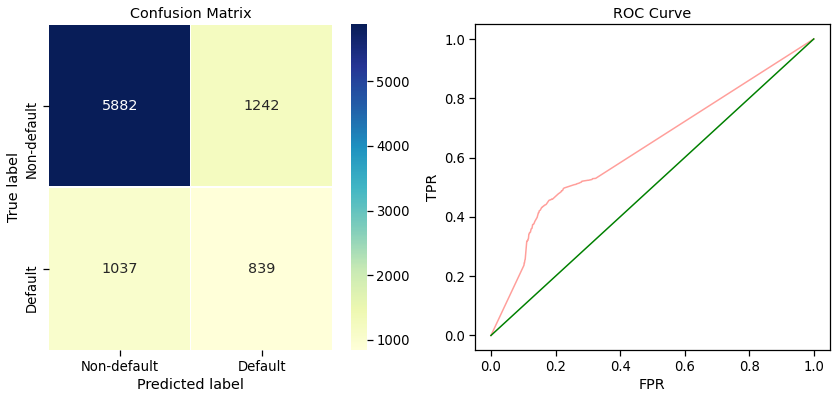

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 7, 'min_samples_split': 39}
Overall Train Accuracy 0.8268437242103683
Train AUC Score 0.9045829665066536
Overall Train recall 0.6747693000225073
Overall Test Accuracy 0.7504444444444445
Test AUC Score 0.7142444112157588
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.82      0.84      7124
           1       0.42      0.50      0.45      1876

    accuracy                           0.75      9000
   macro avg       0.64      0.66      0.65      9000
weighted avg       0.77      0.75      0.76      9000

K-Fold scores: 0.666 (+/- 0.00016)


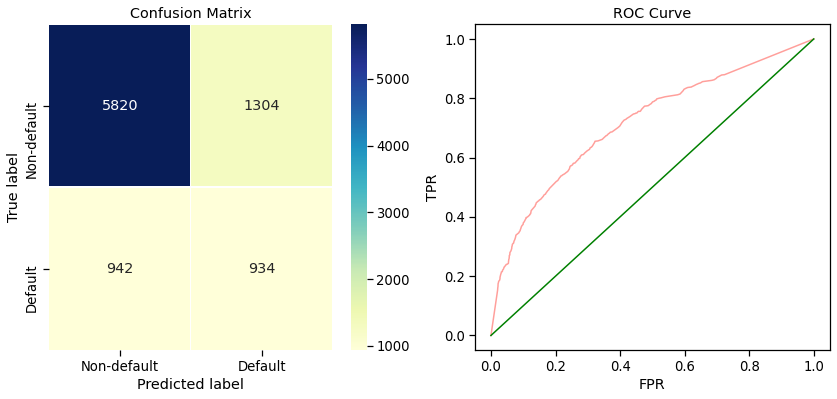

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 29}
Overall Train Accuracy 0.9068671860844356
Train AUC Score 0.9734757713546401
Overall Train recall 0.8763664915141632
Overall Test Accuracy 0.7676666666666667
Test AUC Score 0.6822472895608584
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.87      0.86      7124
           1       0.44      0.40      0.42      1876

    accuracy                           0.77      9000
   macro avg       0.64      0.63      0.64      9000
weighted avg       0.76      0.77      0.76      9000

K-Fold scores: 0.832 (+/- 0.00001)


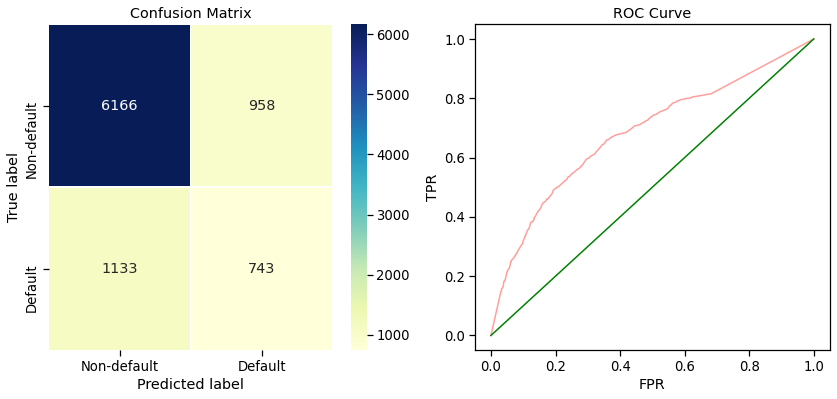

____________________________________________________________


In [85]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(DecisionTreeClassifier(**param_dt[index],random_state= 42), Xtrain,ytrain,X_test,y_test)
    print("_" * 60)
    
    


In [86]:
## Modified Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    print('Data is ',sampleName)
    # Instantiate a Decision Tree classifier: tree
    dtc = DecisionTreeClassifier(random_state = 42)

    # Setup the parameters and distributions to sample from: param_dist
    params = {'max_depth': sp_randint(2,20),
             'min_samples_leaf':sp_randint(1,20),
             'min_samples_split':sp_randint(2,40),
             'criterion':['gini','entropy']}

    # Instantiate the RandomizedSearchCV object: tree_cv
    rsearch_dt = RandomizedSearchCV(dtc, param_distributions= params, cv = 5, scoring = 'recall',n_iter = 100,n_jobs = -1)

    # Fit it to the data
    rsearch_dt.fit(Xtrain, ytrain)
    print("Tuned Decision Tree Parameters: {}".format(rsearch_dt.best_params_), "for",sampleName)
    print("_" * 100) 

Data is  Normal Sampling
Tuned Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 4, 'min_samples_split': 14} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 5} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 6} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Decision Tree Parameters: {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 13} for SMOTE
____________________________________________________________

In [87]:
# Best Parameter of each Sampling Method

param_dt = [{'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 4, 'min_samples_split': 14},
            {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 5},
            {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 6},
           {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 13}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 4, 'min_samples_split': 14}
Overall Train Accuracy 0.8673333333333333
Train AUC Score 0.9012733020275439
Overall Train recall 0.5271213144271888
Overall Test Accuracy 0.7773333333333333
Test AUC Score 0.6506775274785134
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.90      0.87      7124
           1       0.45      0.31      0.36      1876

    accuracy                           0.78      9000
   macro avg       0.64      0.60      0.61      9000
weighted avg       0.75      0.78      0.76      9000

K-Fold scores: 0.602 (+/- 0.00006)


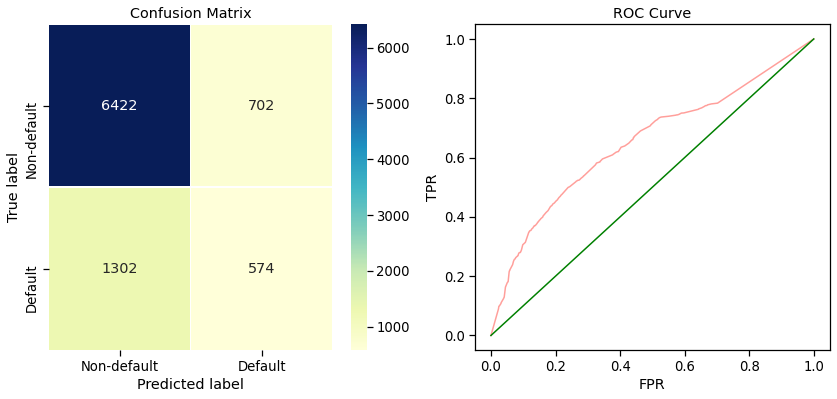

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 5}
Overall Train Accuracy 0.8885309710757667
Train AUC Score 0.9683960003824029
Overall Train recall 0.8459796149490374
Overall Test Accuracy 0.7346666666666667
Test AUC Score 0.6208531942237956
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.82      0.83      7124
           1       0.37      0.39      0.38      1876

    accuracy                           0.73      9000
   macro avg       0.60      0.61      0.61      9000
weighted avg       0.74      0.73      0.74      9000

K-Fold scores: 0.786 (+/- 0.00011)


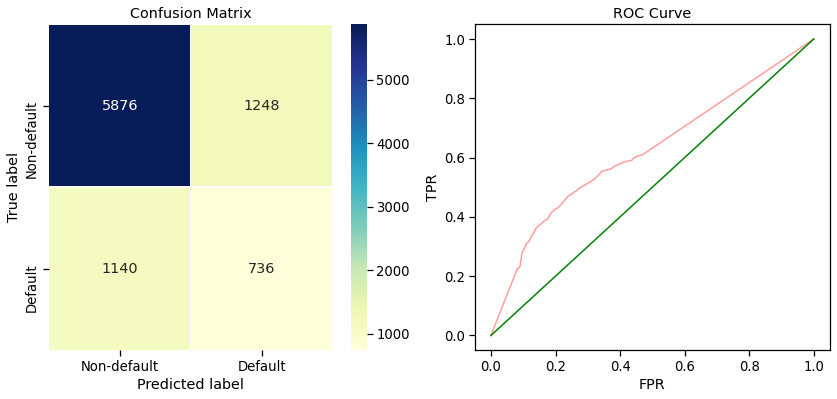

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 6}
Overall Train Accuracy 0.896391327181334
Train AUC Score 0.9608045977535542
Overall Train recall 0.7825793382849426
Overall Test Accuracy 0.7041111111111111
Test AUC Score 0.6147576991316778
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.77      0.81      7124
           1       0.34      0.44      0.38      1876

    accuracy                           0.70      9000
   macro avg       0.59      0.61      0.59      9000
weighted avg       0.73      0.70      0.72      9000

K-Fold scores: 0.617 (+/- 0.00008)


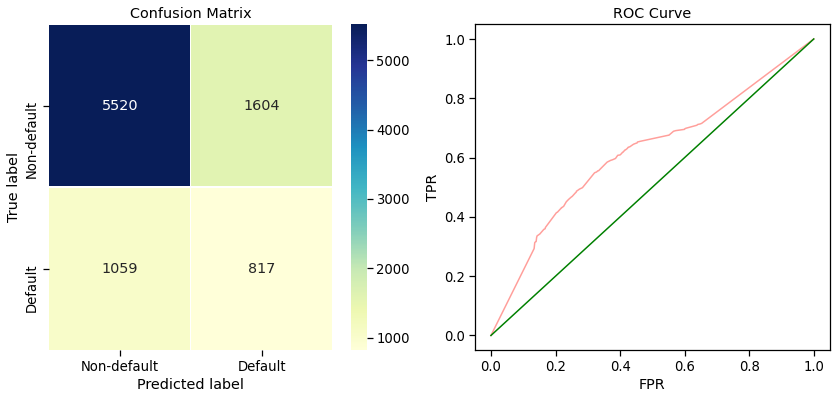

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 13}
Overall Train Accuracy 0.9362203297698859
Train AUC Score 0.9894263832024871
Overall Train recall 0.9153228241831249
Overall Test Accuracy 0.7331111111111112
Test AUC Score 0.6337644815147812
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.84      0.83      7124
           1       0.35      0.34      0.34      1876

    accuracy                           0.73      9000
   macro avg       0.59      0.59      0.59      9000
weighted avg       0.73      0.73      0.73      9000

K-Fold scores: 0.820 (+/- 0.00002)


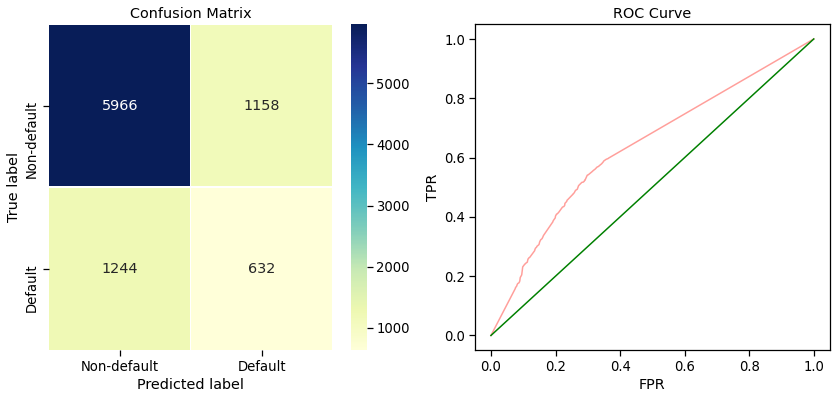

____________________________________________________________


In [88]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_nf_data,ytrain_nf_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(DecisionTreeClassifier(**param_dt[index],random_state= 42), Xtrain,ytrain,X_nf_test,y_nf_test)
    print("_" * 60)
    

### v) Random Forest

In [89]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    global best_rf
    best_rf =[]
    print('Data is ',sampleName)
    # Instantiate a Random forest classifier: tree
    rfc = RandomForestClassifier(random_state = 42)

    # Setup the parameters and distributions to sample from: param_dist
    params = {'n_estimators' : sp_randint(50,200),
              'max_features' : sp_randint(1,24),'max_depth': sp_randint(2,10),
             'min_samples_leaf':sp_randint(1,20),
             'min_samples_split':sp_randint(2,20),
             'criterion':['gini','entropy']}

    # Instantiate the RandomizedSearchCV object
    rsearch_rfc = RandomizedSearchCV(rfc, param_distributions= params, cv = 5, scoring = 'recall',n_iter = 200,random_state = 42,n_jobs = -1,return_train_score = True)

    # Fit it to the data
    rsearch_rfc.fit(Xtrain, ytrain)
    best_rf.append(rsearch_rfc.best_params_)
    print("Tuned Random Tree Parameters: {}".format(rsearch_rfc.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned Random Tree Parameters: {'criterion': 'gini', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 8, 'min_samples_split': 12, 'n_estimators': 154} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Random Tree Parameters: {'criterion': 'gini', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 8, 'min_samples_split': 12, 'n_estimators': 154} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Random Tree Parameters: {'criterion': 'gini', 'max_depth': 9, 'max_features': 7, 'min_samples_leaf': 13, 'min_samples_split': 11, 'n_estimators': 191} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Random Tree Parameters: {'criterion': 'gini', 'max_depth': 9, 'max_features'

In [90]:
# Best Parameter of each Sampling Method

param_rf = [{'criterion': 'gini', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 8, 'min_samples_split': 12, 'n_estimators': 154},
             {'criterion': 'gini', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 8, 'min_samples_split': 12, 'n_estimators': 154},
             {'criterion': 'gini', 'max_depth': 9, 'max_features': 7, 'min_samples_leaf': 13, 'min_samples_split': 11, 'n_estimators': 191},
            {'criterion': 'gini', 'max_depth': 9, 'max_features': 13, 'min_samples_leaf': 19, 'min_samples_split': 18, 'n_estimators': 79}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 4, 'min_samples_split': 14}
Overall Train Accuracy 0.856904761904762
Train AUC Score 0.8459927905632567
Overall Train recall 0.45217195588566284
Overall Test Accuracy 0.8297777777777777
Test AUC Score 0.7832161234016011
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.95      0.90      7124
           1       0.67      0.37      0.47      1876

    accuracy                           0.83      9000
   macro avg       0.76      0.66      0.69      9000
weighted avg       0.81      0.83      0.81      9000

K-Fold scores: 0.668 (+/- 0.00010)


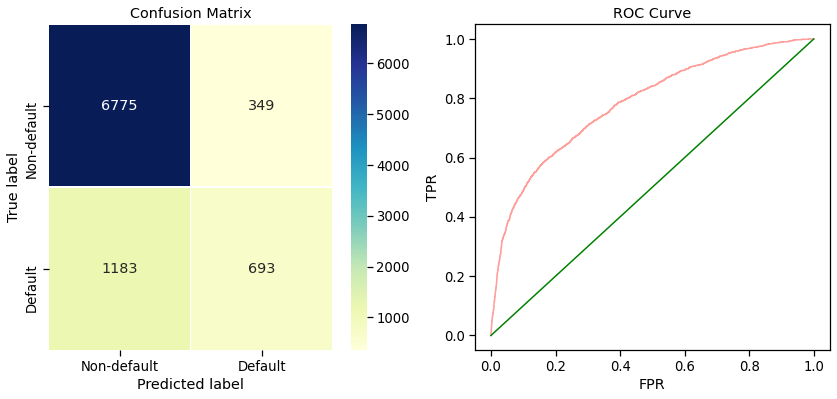

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 5}
Overall Train Accuracy 0.77649151063687
Train AUC Score 0.8594600603340309
Overall Train recall 0.6122310305775764
Overall Test Accuracy 0.8086666666666666
Test AUC Score 0.7820397715640933
Classification Report of Test
               precision    recall  f1-score   support

           0       0.87      0.88      0.88      7124
           1       0.54      0.52      0.53      1876

    accuracy                           0.81      9000
   macro avg       0.71      0.70      0.71      9000
weighted avg       0.81      0.81      0.81      9000

K-Fold scores: 0.740 (+/- 0.00002)


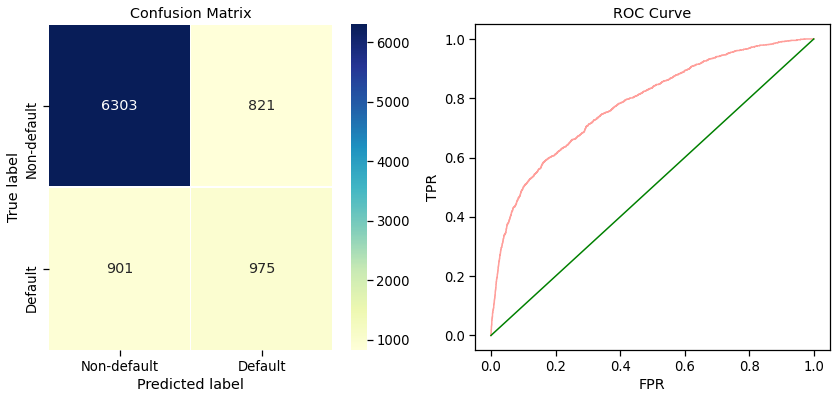

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 6}
Overall Train Accuracy 0.7906819716407832
Train AUC Score 0.8391955947465506
Overall Train recall 0.5239702903443619
Overall Test Accuracy 0.8193333333333334
Test AUC Score 0.7851830698716253
Classification Report of Test
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      7124
           1       0.58      0.48      0.52      1876

    accuracy                           0.82      9000
   macro avg       0.72      0.69      0.71      9000
weighted avg       0.81      0.82      0.81      9000

K-Fold scores: 0.701 (+/- 0.00009)


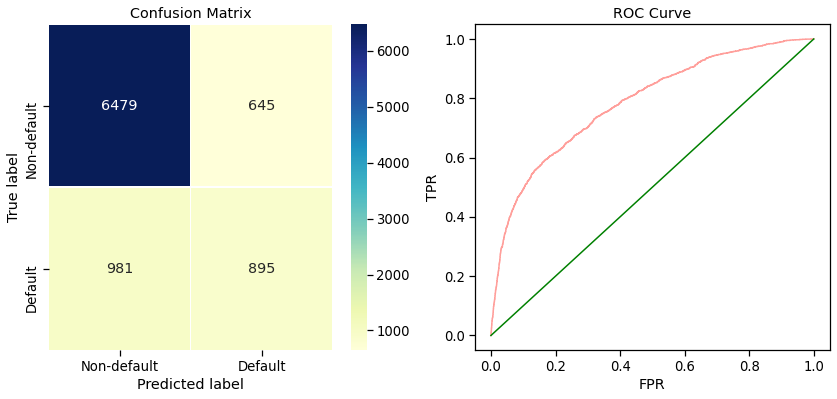

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 13}
Overall Train Accuracy 0.8758229147792475
Train AUC Score 0.9408881832200399
Overall Train recall 0.8240623301322704
Overall Test Accuracy 0.818
Test AUC Score 0.7708802731749131
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.92      0.89      7124
           1       0.58      0.44      0.50      1876

    accuracy                           0.82      9000
   macro avg       0.72      0.68      0.70      9000
weighted avg       0.80      0.82      0.81      9000

K-Fold scores: 0.868 (+/- 0.00003)


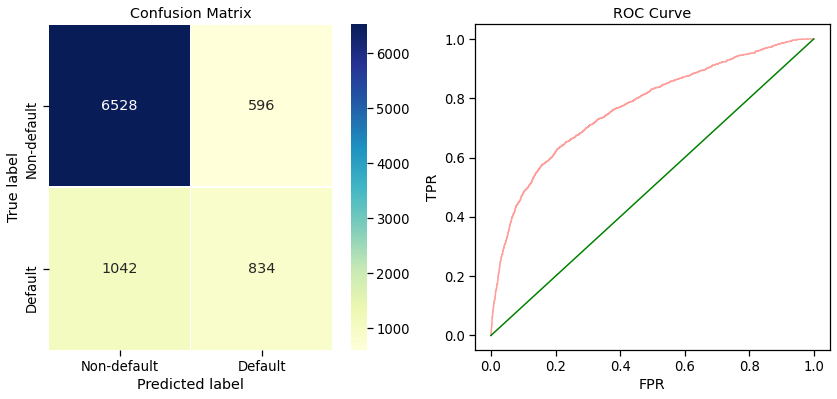

____________________________________________________________


In [91]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(RandomForestClassifier(**param_rf[index],random_state= 42), Xtrain, ytrain,X_test,y_test)
    print("_" * 60)
    


In [97]:
## Modified Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    global best_rf
    best_rf =[]
    print('Data is ',sampleName)
    # Instantiate a Random forest classifier: tree
    rfc = RandomForestClassifier(random_state = 42)

    # Setup the parameters and distributions to sample from: param_dist
    params = {'n_estimators' : sp_randint(50,200),
              'max_features' : sp_randint(1,24),'max_depth': sp_randint(2,10),
             'min_samples_leaf':sp_randint(1,20),
             'min_samples_split':sp_randint(2,20),
             'criterion':['gini','entropy']}

    # Instantiate the RandomizedSearchCV object
    rsearch_rfc = RandomizedSearchCV(rfc, param_distributions= params, cv = 5, scoring = 'recall',n_iter = 200,random_state = 42,n_jobs = -1,return_train_score = True)

    # Fit it to the data
    rsearch_rfc.fit(Xtrain, ytrain)
    best_rf.append(rsearch_rfc.best_params_)
    print("Tuned Random Tree Parameters: {}".format(rsearch_rfc.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Random Tree Parameters: {'criterion': 'gini', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 8, 'min_samples_split': 12, 'n_estimators': 154} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'max_features': 19, 'min_samples_leaf': 18, 'min_samples_split': 2, 'n_estimators': 127} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Random Tree Parameters: {'criterion': 'entropy', 'max_depth': 9, 'max_

In [98]:
# Best Parameter of each Sampling Method

param_rf = [{'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162},
            {'criterion': 'gini', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 8, 'min_samples_split': 12, 'n_estimators': 154},
            {'criterion': 'entropy', 'max_depth': 9, 'max_features': 19, 'min_samples_leaf': 18, 'min_samples_split': 2, 'n_estimators': 127},
            {'criterion': 'entropy', 'max_depth': 9, 'max_features': 22, 'min_samples_leaf': 1, 'min_samples_split': 12, 'n_estimators': 162}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 4, 'min_samples_split': 14}
Overall Train Accuracy 0.8395238095238096
Train AUC Score 0.8271806406478736
Overall Train recall 0.3603421111861355
Overall Test Accuracy 0.8102222222222222
Test AUC Score 0.7523186585720631
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.95      0.89      7124
           1       0.60      0.27      0.37      1876

    accuracy                           0.81      9000
   macro avg       0.72      0.61      0.63      9000
weighted avg       0.78      0.81      0.78      9000

K-Fold scores: 0.626 (+/- 0.00008)


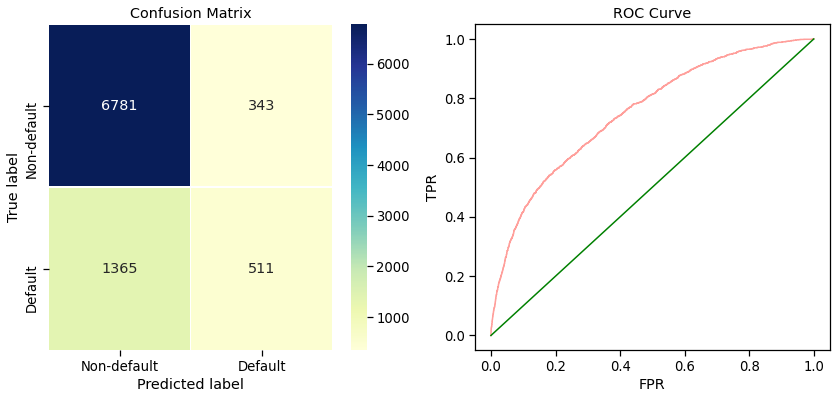

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 5}
Overall Train Accuracy 0.7457217636400242
Train AUC Score 0.8418142772421013
Overall Train recall 0.5392978482446206
Overall Test Accuracy 0.7976666666666666
Test AUC Score 0.7519137089079349
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.89      0.87      7124
           1       0.52      0.44      0.48      1876

    accuracy                           0.80      9000
   macro avg       0.69      0.67      0.68      9000
weighted avg       0.79      0.80      0.79      9000

K-Fold scores: 0.704 (+/- 0.00002)


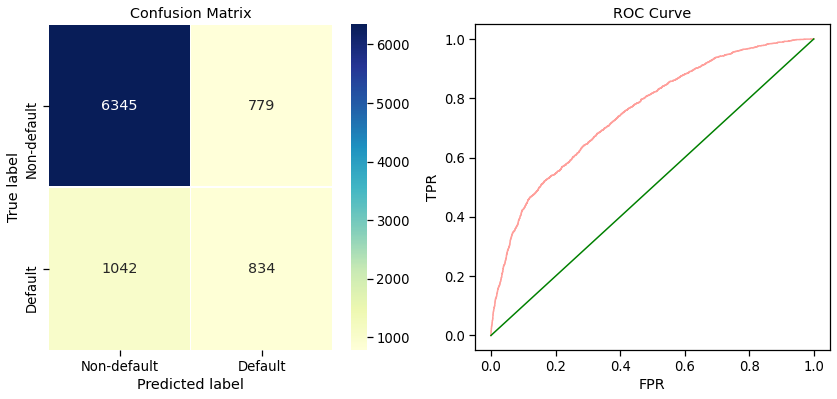

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 6}
Overall Train Accuracy 0.7605971940880786
Train AUC Score 0.81207358377293
Overall Train recall 0.4418185910420887
Overall Test Accuracy 0.8025555555555556
Test AUC Score 0.7530314358264026
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.91      0.88      7124
           1       0.53      0.40      0.46      1876

    accuracy                           0.80      9000
   macro avg       0.69      0.66      0.67      9000
weighted avg       0.79      0.80      0.79      9000

K-Fold scores: 0.664 (+/- 0.00006)


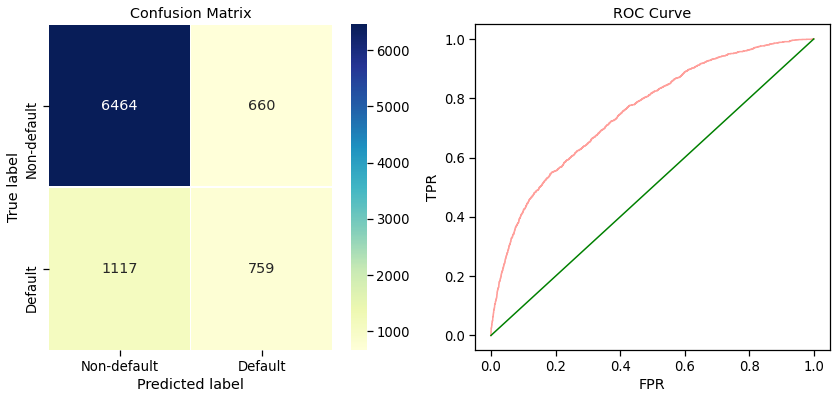

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 13}
Overall Train Accuracy 0.8796279519236576
Train AUC Score 0.9514382166819295
Overall Train recall 0.8232167663224014
Overall Test Accuracy 0.8047777777777778
Test AUC Score 0.7426507098142079
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.92      0.88      7124
           1       0.55      0.36      0.44      1876

    accuracy                           0.80      9000
   macro avg       0.70      0.64      0.66      9000
weighted avg       0.78      0.80      0.79      9000

K-Fold scores: 0.866 (+/- 0.00003)


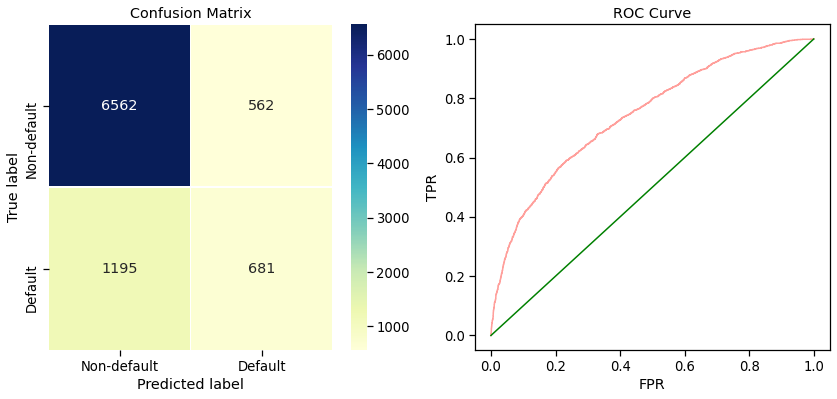

____________________________________________________________


In [99]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_nf_data,ytrain_nf_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(RandomForestClassifier(**param_rf[index],random_state= 42), Xtrain, ytrain,X_nf_test,y_nf_test)
    print("_" * 60)
    


### vi) AdaBoost Classifier

In [64]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    global best_ada
    best_ada =[]
    print('Data is ',sampleName)
    # Instantiate a Ada Boost classifier
    ada = AdaBoostClassifier()

    #Creating a grid of hyperparameters
    param_grid = {'n_estimators': [200,300],
                  'algorithm': ['SAMME', 'SAMME.R'],
                  'learning_rate' : [0.5, 0.75, 1.0]}

    #Building a 5 fold CV GridSearchCV object
    grid_ada = GridSearchCV(ada, param_grid, scoring = 'accuracy', cv=5,n_jobs = -1)

    #Fitting the grid to the training data
    grid_ada.fit(Xtrain,ytrain)
    best_ada.append(grid_ada.best_params_)
    print("Tuned Ada Boost Parameters: {}".format(grid_ada.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 200} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME', 'learning_rate': 0.5, 'n_estimators': 300} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 0.75, 'n_estimators': 300} for SMOTE
____________________________________________________________________________________________________


In [65]:
# Best Parameter of each Sampling Method

param_ada = [{'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 200},
            {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300},
            {'algorithm': 'SAMME', 'learning_rate': 0.5, 'n_estimators': 300},
            {'algorithm': 'SAMME.R', 'learning_rate': 0.75, 'n_estimators': 300}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 36}
Overall Train Accuracy 0.829
Train AUC Score 0.7931408383571736
Overall Train recall 0.34301147873058746
Overall Test Accuracy 0.8252222222222222
Test AUC Score 0.7748770186127196
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.96      0.90      7124
           1       0.67      0.32      0.43      1876

    accuracy                           0.83      9000
   macro avg       0.76      0.64      0.67      9000
weighted avg       0.81      0.83      0.80      9000

K-Fold scores: 0.651 (+/- 0.00011)


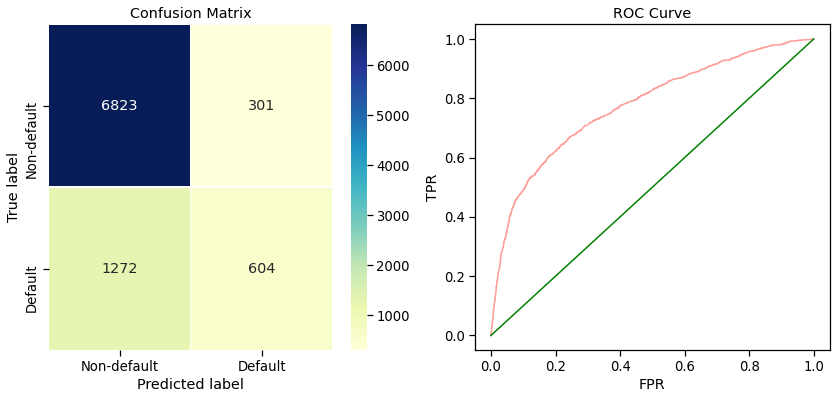

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 6, 'min_samples_split': 5}
Overall Train Accuracy 0.7501174417824307
Train AUC Score 0.8197403239476572
Overall Train recall 0.5959229898074745
Overall Test Accuracy 0.7957777777777778
Test AUC Score 0.7671797949571943
Classification Report of Test
               precision    recall  f1-score   support

           0       0.88      0.86      0.87      7124
           1       0.51      0.54      0.53      1876

    accuracy                           0.80      9000
   macro avg       0.69      0.70      0.70      9000
weighted avg       0.80      0.80      0.80      9000

K-Fold scores: 0.728 (+/- 0.00003)


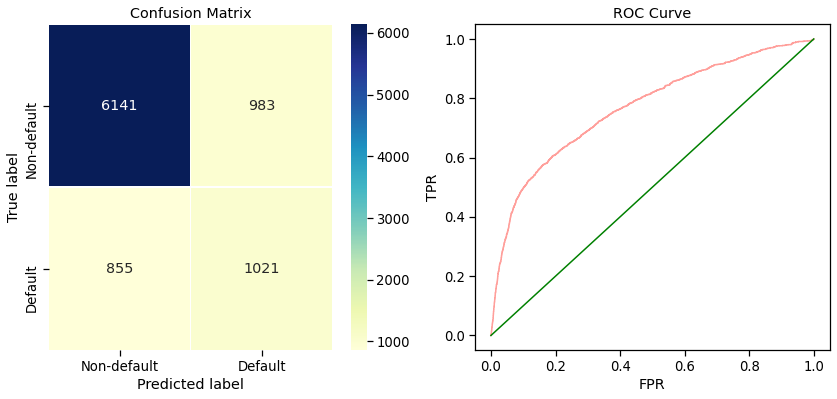

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 34}
Overall Train Accuracy 0.7693750468902393
Train AUC Score 0.7906298573032184
Overall Train recall 0.4537474679270763
Overall Test Accuracy 0.827
Test AUC Score 0.774777689218941
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.93      0.90      7124
           1       0.63      0.42      0.51      1876

    accuracy                           0.83      9000
   macro avg       0.74      0.68      0.70      9000
weighted avg       0.81      0.83      0.81      9000

K-Fold scores: 0.689 (+/- 0.00008)


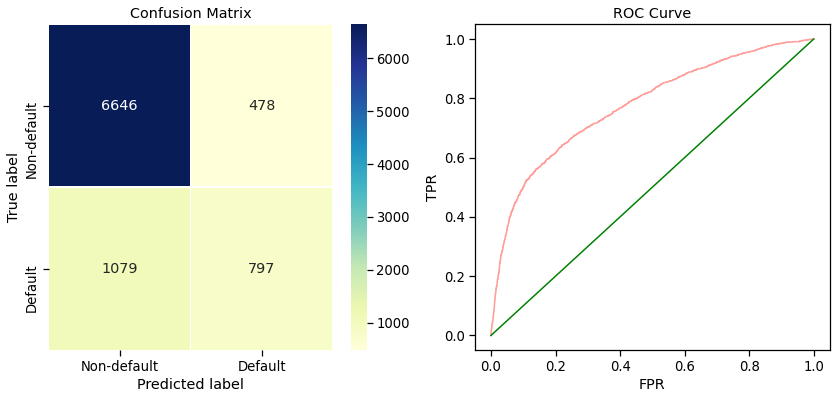

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 18, 'min_samples_split': 33}
Overall Train Accuracy 0.8702361538926134
Train AUC Score 0.9314634743067074
Overall Train recall 0.7993597874010993
Overall Test Accuracy 0.824
Test AUC Score 0.770575887507198
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.94      0.89      7124
           1       0.62      0.39      0.48      1876

    accuracy                           0.82      9000
   macro avg       0.74      0.66      0.69      9000
weighted avg       0.81      0.82      0.81      9000

K-Fold scores: 0.869 (+/- 0.00002)


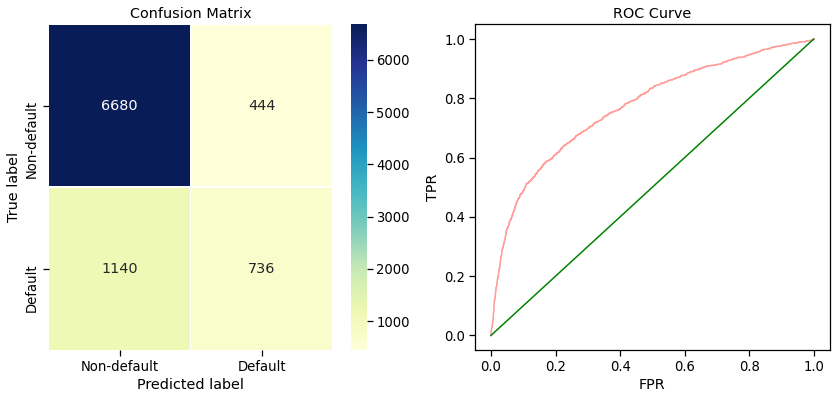

____________________________________________________________


In [66]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(AdaBoostClassifier(**param_ada[index]), Xtrain,ytrain,X_test,y_test)
    print("_" * 60)
    



In [68]:
## Modified Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    global best_ada
    best_ada =[]
    print('Data is ',sampleName)
    # Instantiate a Ada Boost classifier
    ada = AdaBoostClassifier()

    #Creating a grid of hyperparameters
    param_grid = {'n_estimators': [200,300],
                  'algorithm': ['SAMME', 'SAMME.R'],
                  'learning_rate' : [0.5, 0.75, 1.0]}

    #Building a 5 fold CV GridSearchCV object
    grid_ada = GridSearchCV(ada, param_grid, scoring = 'recall', cv=5,n_jobs = -1)

    #Fitting the grid to the training data
    grid_ada.fit(Xtrain,ytrain)
    best_ada.append(grid_ada.best_params_)
    print("Tuned Ada Boost Parameters: {}".format(grid_ada.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Ada Boost Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 200} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Ada Boost Parameters: {'algorithm': 'SAMME', 'learning_rate': 0.75, 'n_estimators': 300} for SMOTE
____________________________________________________________________________________________________


In [69]:
# Best Parameter of each Sampling Method

param_ada = [ {'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 300},
            {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 300},
           {'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 200},
           {'algorithm': 'SAMME', 'learning_rate': 0.75, 'n_estimators': 300}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 36}
Overall Train Accuracy 0.815
Train AUC Score 0.7606129085629221
Overall Train recall 0.29597119063695704
Overall Test Accuracy 0.8122222222222222
Test AUC Score 0.7402434591500666
Classification Report of Test
               precision    recall  f1-score   support

           0       0.83      0.95      0.89      7124
           1       0.61      0.27      0.38      1876

    accuracy                           0.81      9000
   macro avg       0.72      0.61      0.63      9000
weighted avg       0.79      0.81      0.78      9000

K-Fold scores: 0.624 (+/- 0.00010)


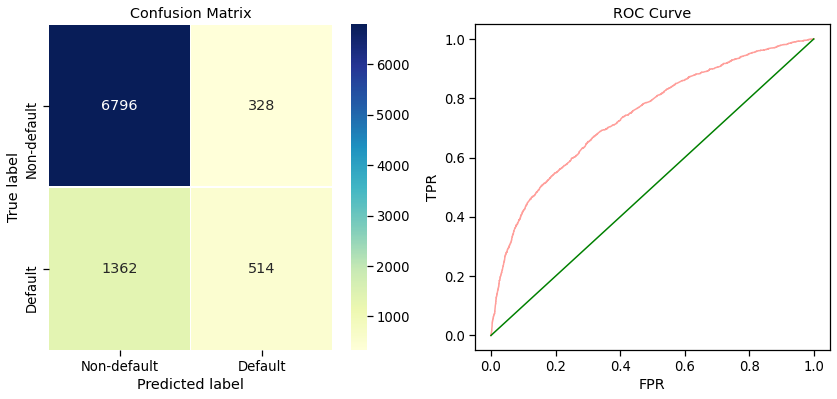

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 6, 'min_samples_split': 5}
Overall Train Accuracy 0.7224682907187437
Train AUC Score 0.7928877632032819
Overall Train recall 0.5546998867497168
Overall Test Accuracy 0.7711111111111111
Test AUC Score 0.7359219758071758
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.84      0.85      7124
           1       0.46      0.50      0.48      1876

    accuracy                           0.77      9000
   macro avg       0.66      0.67      0.66      9000
weighted avg       0.78      0.77      0.77      9000

K-Fold scores: 0.694 (+/- 0.00001)


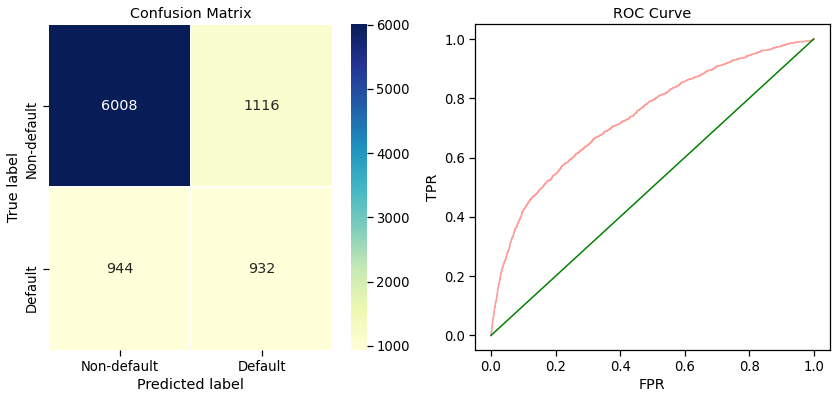

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 34}
Overall Train Accuracy 0.7542951459224247
Train AUC Score 0.7808492815870762
Overall Train recall 0.4314652261985145
Overall Test Accuracy 0.8034444444444444
Test AUC Score 0.7357027777212438
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.91      0.88      7124
           1       0.54      0.41      0.46      1876

    accuracy                           0.80      9000
   macro avg       0.70      0.66      0.67      9000
weighted avg       0.79      0.80      0.79      9000

K-Fold scores: 0.662 (+/- 0.00004)


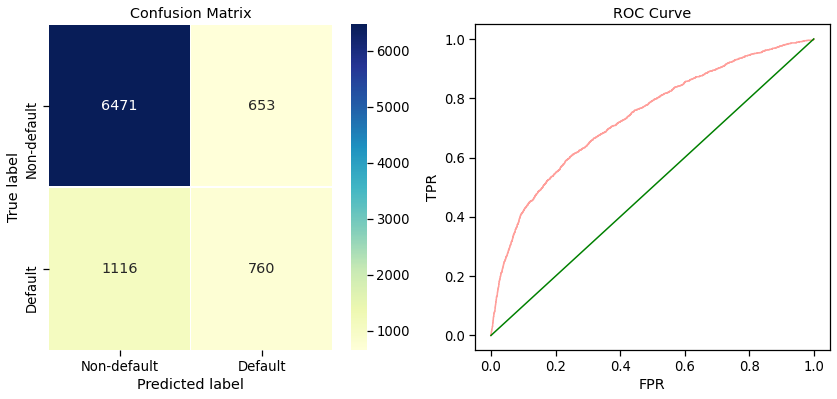

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 18, 'min_samples_split': 33}
Overall Train Accuracy 0.8656459503533249
Train AUC Score 0.9213343021579183
Overall Train recall 0.8010509150208371
Overall Test Accuracy 0.8051111111111111
Test AUC Score 0.7275282866169673
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.93      0.88      7124
           1       0.55      0.34      0.42      1876

    accuracy                           0.81      9000
   macro avg       0.70      0.63      0.65      9000
weighted avg       0.78      0.81      0.79      9000

K-Fold scores: 0.865 (+/- 0.00002)


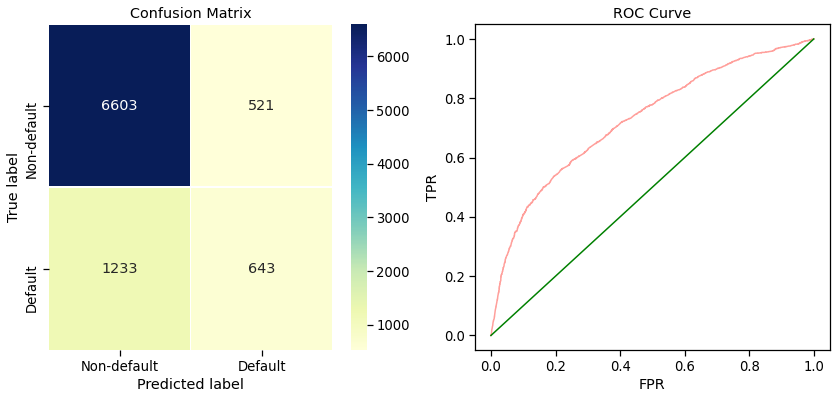

____________________________________________________________


In [70]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_nf_data,ytrain_nf_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(AdaBoostClassifier(**param_ada[index]), Xtrain,ytrain,X_nf_test,y_nf_test)
    print("_" * 60)
    



### vii) GradientBoosting Classifier

In [43]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    global best_gbc
    best_gbc =[]
    print('Data is ',sampleName)
    # Instantiate a Gradient Boost classifier
    gbc = GradientBoostingClassifier()

    #Creating a grid of hyperparameters
    param_grid = {'n_estimators': [200,300],
                  'learning_rate' : [0.5, 0.75, 1.0]}

    #Building a 5 fold CV GridSearchCV object
    grid_gbc = GridSearchCV(gbc, param_grid, scoring = 'recall', cv=5,n_jobs = -1)

    #Fitting the grid to the training data
    grid_gbc.fit(Xtrain,ytrain)
    best_gbc.append(grid_gbc.best_params_)
    print("Tuned Random Tree Parameters: {}".format(grid_gbc.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 200} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
Tuned Random Tree Parameters: {'learning_rate': 1.0, 'n_estimators': 300} for Over Sampling
____________________________________________________________________________________________________
Data is  Under Sampling
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 200} for Under Sampling
____________________________________________________________________________________________________
Data is  SMOTE
Tuned Random Tree Parameters: {'learning_rate': 0.5, 'n_estimators': 200} for SMOTE
____________________________________________________________________________________________________


In [30]:
# Best Parameter of each Sampling Method

param_gbc = [{'learning_rate': 0.5, 'n_estimators': 200},
            {'learning_rate': 1.0, 'n_estimators': 300},
            {'learning_rate': 0.5, 'n_estimators': 200},
            {'learning_rate': 0.5, 'n_estimators': 200}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 4, 'min_samples_split': 26}
Overall Train Accuracy 0.8670952380952381
Train AUC Score 0.8961920057564012
Overall Test Accuracy 0.8042222222222222
Test AUC Score 0.7550211618738405
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.93      0.88      7040
           1       0.58      0.37      0.45      1960

    accuracy                           0.80      9000
   macro avg       0.71      0.65      0.67      9000
weighted avg       0.78      0.80      0.79      9000

K-Fold scores: 0.659 (+/- 0.00013)


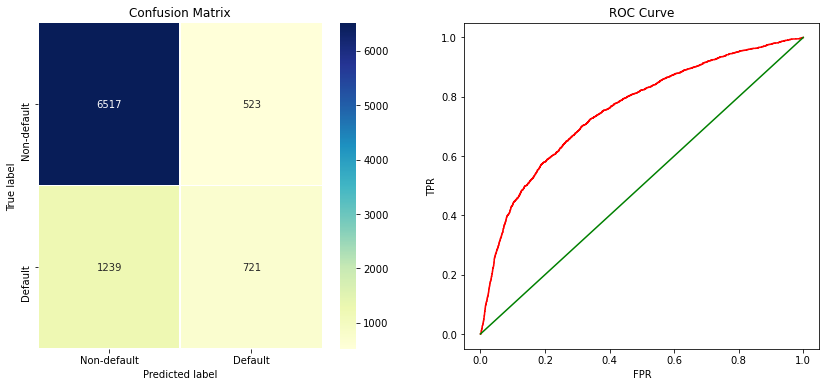

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 19, 'min_samples_leaf': 3, 'min_samples_split': 5}
Overall Train Accuracy 0.9015866209262435
Train AUC Score 0.9619559114317092
Overall Test Accuracy 0.7342222222222222
Test AUC Score 0.7170238940746754
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.79      0.82      7040
           1       0.41      0.53      0.46      1960

    accuracy                           0.73      9000
   macro avg       0.64      0.66      0.64      9000
weighted avg       0.76      0.73      0.75      9000

K-Fold scores: 0.825 (+/- 0.00001)


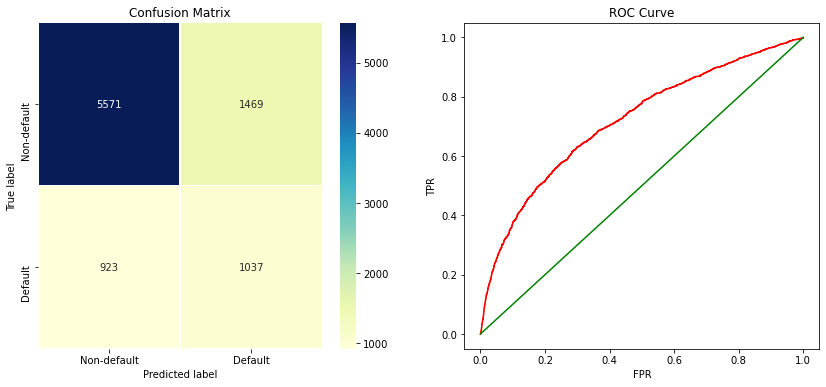

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 15, 'min_samples_split': 27}
Overall Train Accuracy 0.8588537211291702
Train AUC Score 0.9347821374237959
Overall Test Accuracy 0.7098888888888889
Test AUC Score 0.7461708603896103
Classification Report of Test
               precision    recall  f1-score   support

           0       0.88      0.73      0.80      7040
           1       0.40      0.65      0.50      1960

    accuracy                           0.71      9000
   macro avg       0.64      0.69      0.65      9000
weighted avg       0.78      0.71      0.73      9000

K-Fold scores: 0.683 (+/- 0.00001)


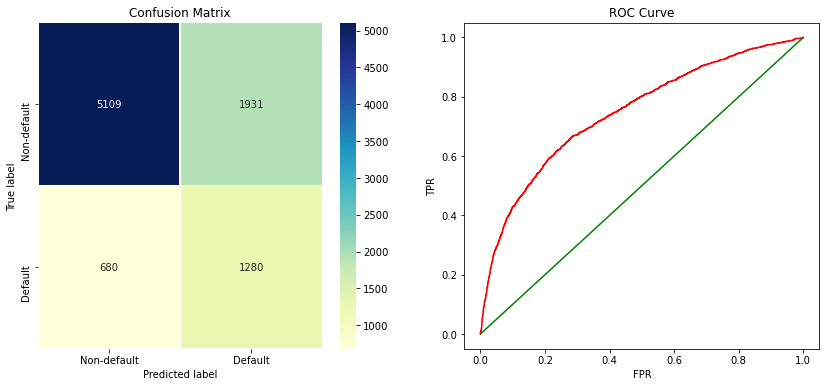

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 19, 'min_samples_split': 11}
Overall Train Accuracy 0.8961957853467287
Train AUC Score 0.9613039710263152
Overall Test Accuracy 0.8013333333333333
Test AUC Score 0.7514216865723563
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.91      0.88      7040
           1       0.56      0.40      0.47      1960

    accuracy                           0.80      9000
   macro avg       0.70      0.66      0.67      9000
weighted avg       0.78      0.80      0.79      9000

K-Fold scores: 0.860 (+/- 0.00002)


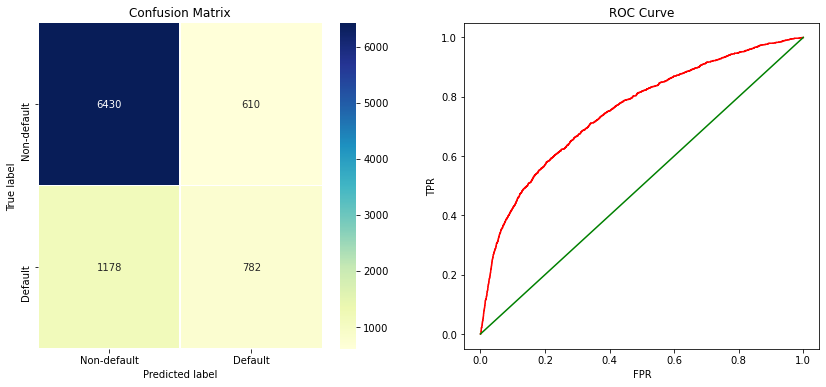

____________________________________________________________


In [31]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index  in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName ,' And with hyper parameter ',param_dt[index])
    model_eval(GradientBoostingClassifier(**param_gbc[index]), Xtrain,ytrain,X_test,y_test)
    print("_" * 60)
    
    


### viii) XGBoost Classifier

In [71]:
## Original Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_data,ytrain_data,name):
    global best_xgb
    best_xgb =[]
    print('Data is ',sampleName)  # Instantiate a XGBoost classifier
    xgb= XGBClassifier()

    param_grid = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30] ,
                  "max_depth"        : [3, 4, 5, 6, 8, 10, 12, 15],
                 "min_child_weight" : [1, 3, 5, 7],
                 "gamma"            : [0.0, 0.1, 0.2 , 0.3, 0.4],
                 "colsample_bytree" : [0.3, 0.4, 0.5 , 0.7] }

    #Building a 5 fold CV GridSearchCV object
    xgb_RS = RandomizedSearchCV(xgb, param_grid ,cv = 5, scoring = 'recall',n_iter = 200,n_jobs = -1)

    #Fitting the grid to the training data
    xgb_RS.fit(Xtrain,ytrain)
    best_xgb.append(xgb_RS.best_params_)
    print("Tuned XG Boost Parameters: {}".format(xgb_RS.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
[21:14:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned XG Boost Parameters: {'min_child_weight': 7, 'max_depth': 3, 'learning_rate': 0.25, 'gamma': 0.2, 'colsample_bytree': 0.4} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
[21:51:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned XG Boost Parameters: {'min_child_weight': 3, 'max_depth': 15, 'learning_rate

In [72]:
# Best Parameter of each Sampling Method

param_xgb = [{'min_child_weight': 7, 'max_depth': 3, 'learning_rate': 0.25,
                            'gamma': 0.2, 'colsample_bytree': 0.4},
            {'min_child_weight': 1, 'max_depth': 15, 'learning_rate': 0.3,
                            'gamma': 0.3, 'colsample_bytree': 0.7},
            {'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.3,
                            'gamma': 0.1, 'colsample_bytree': 0.7},
            {'min_child_weight': 1, 'max_depth': 15, 'learning_rate': 0.05,
                            'gamma': 0.3, 'colsample_bytree': 0.4}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 36}
[23:09:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.8401428571428572
Train AUC Score 0.8326837722531611
Overall Train recall 0.41368444744541977
Overall Test Accuracy 0.8296666666666667
Test AUC Score 0.7813959075840816
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.95      0.90      7124
           1       0.66      0.38      0.48      1876

    accuracy                           0.83      9000
   macro avg       0.76      0.66      0.69      9000
weighted avg       0.81      0.83      0.81      900

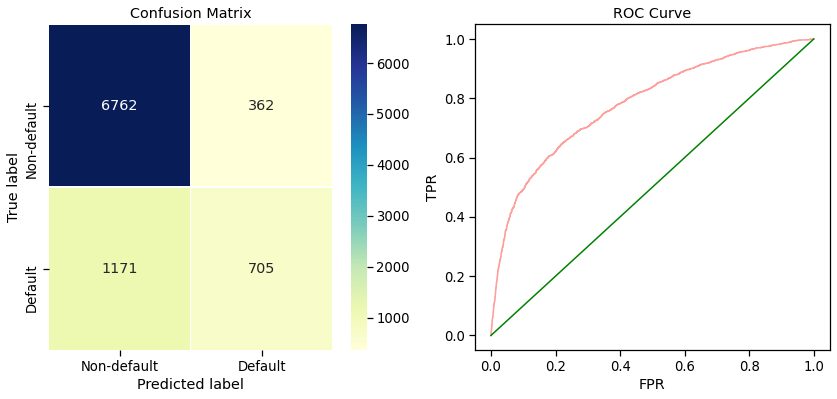

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 6, 'min_samples_split': 5}
[23:09:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.9999328904100396
Train AUC Score 0.9999999635198702
Overall Train recall 0.9999244998112495
Overall Test Accuracy 0.8123333333333334
Test AUC Score 0.7536283849063019
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.92      0.89      7124
           1       0.57      0.40      0.47      1876

    accuracy                           0.81      9000
   macro avg       0.71      0.66      0.68      

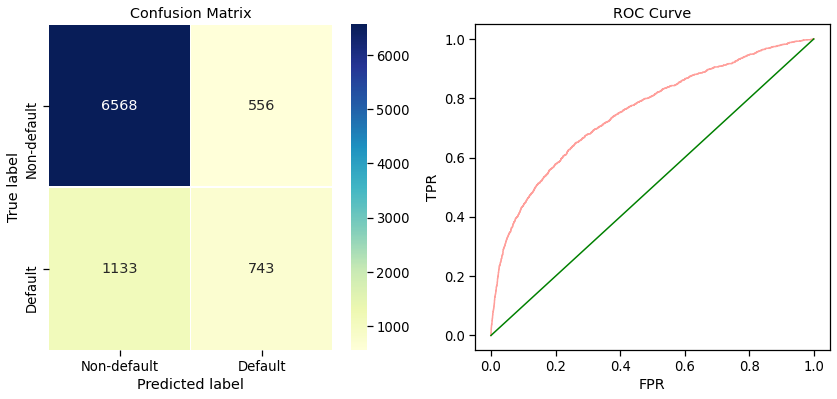

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 34}
[23:10:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.9516092730137294
Train AUC Score 0.9931318242236965
Overall Train recall 0.8786855728111637
Overall Test Accuracy 0.7871111111111111
Test AUC Score 0.7573087353598575
Classification Report of Test
               precision    recall  f1-score   support

           0       0.86      0.87      0.87      7124
           1       0.49      0.49      0.49      1876

    accuracy                           0.79      9000
   macro avg       0.68      0.68      0.68      9

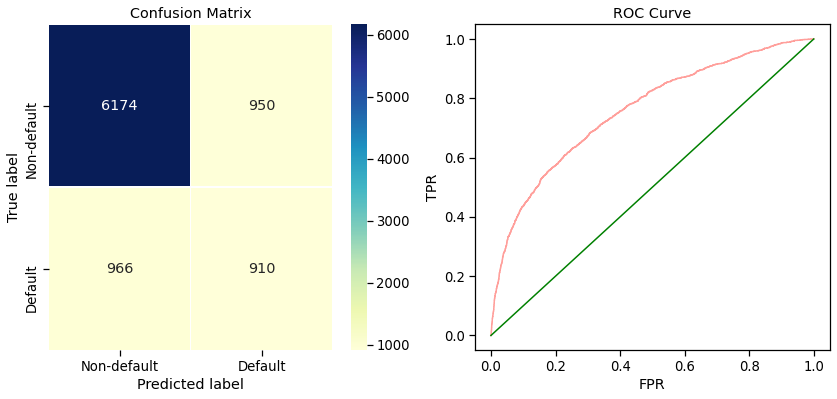

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 18, 'min_samples_split': 33}
[23:10:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.9944736365283566
Train AUC Score 0.9999349151006668
Overall Train recall 0.9894304523766383
Overall Test Accuracy 0.808
Test AUC Score 0.7652783198390017
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.91      0.88      7124
           1       0.55      0.40      0.47      1876

    accuracy                           0.81      9000
   macro avg       0.70      0.66      0.68      9000
weighted avg     

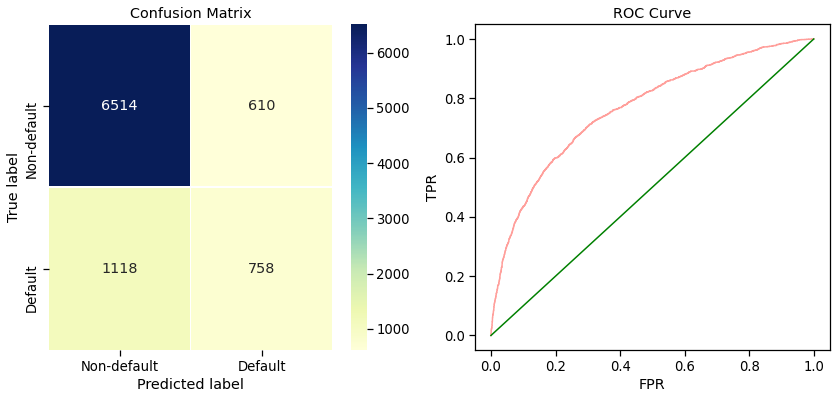

____________________________________________________________


In [73]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_data,ytrain_data,name,index):
    print('Data is ',sampleName,' And with hyper parameter ',param_dt[index])
    model_eval(XGBClassifier(**param_xgb[index]), Xtrain, ytrain, X_test, y_test)
    print("_" * 60)
    
    

In [74]:
## Modified Dataset

# Find out the best parameters for all the datasets

for Xtrain,ytrain,sampleName in zip(xtrain_nf_data,ytrain_nf_data,name):
    global best_xgb
    best_xgb =[]
    print('Data is ',sampleName)  # Instantiate a XGBoost classifier
    xgb= XGBClassifier()

    param_grid = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30] ,
                  "max_depth"        : [3, 4, 5, 6, 8, 10, 12, 15],
                 "min_child_weight" : [1, 3, 5, 7],
                 "gamma"            : [0.0, 0.1, 0.2 , 0.3, 0.4],
                 "colsample_bytree" : [0.3, 0.4, 0.5 , 0.7] }

    #Building a 5 fold CV GridSearchCV object
    xgb_RS = RandomizedSearchCV(xgb, param_grid ,cv = 5, scoring = 'recall',n_iter = 200,n_jobs = -1)

    #Fitting the grid to the training data
    xgb_RS.fit(Xtrain,ytrain)
    best_xgb.append(xgb_RS.best_params_)
    print("Tuned XG Boost Parameters: {}".format(xgb_RS.best_params_), "for",sampleName)
    print("_" * 100)

Data is  Normal Sampling
[11:49:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned XG Boost Parameters: {'min_child_weight': 5, 'max_depth': 4, 'learning_rate': 0.3, 'gamma': 0.4, 'colsample_bytree': 0.7} for Normal Sampling
____________________________________________________________________________________________________
Data is  Over Sampling
[12:47:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Tuned XG Boost Parameters: {'min_child_weight': 1, 'max_depth': 15, 'learning_rate'

In [75]:
# Best Parameter of each Sampling Method

param_xgb = [{'min_child_weight': 5, 'max_depth': 4, 'learning_rate': 0.3, 
              'gamma': 0.4, 'colsample_bytree': 0.7},
            {'min_child_weight': 1, 'max_depth': 15, 'learning_rate': 0.3, 
             'gamma': 0.0, 'colsample_bytree': 0.4},
            {'min_child_weight': 7, 'max_depth': 12, 'learning_rate': 0.25,
             'gamma': 0.0, 'colsample_bytree': 0.5},
            {'min_child_weight': 1, 'max_depth': 15, 'learning_rate': 0.1,
                            'gamma': 0.0, 'colsample_bytree': 0.3}]

Data is  Normal Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 19, 'min_samples_split': 36}
[14:21:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.8376190476190476
Train AUC Score 0.8514190694146281
Overall Train recall 0.3731712806662165
Overall Test Accuracy 0.8096666666666666
Test AUC Score 0.7461910638114473
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.95      0.89      7124
           1       0.59      0.30      0.39      1876

    accuracy                           0.81      9000
   macro avg       0.71      0.62      0.64      9000
weighted avg       0.78      0.81      0.78      9000

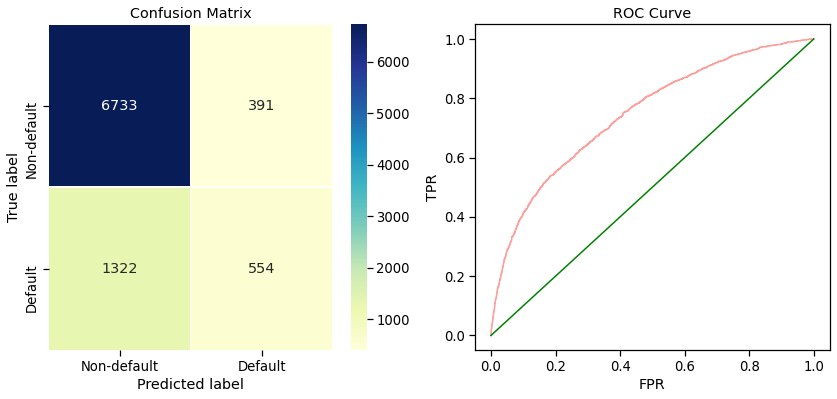

____________________________________________________________
Data is  Over Sampling  And with hyper parameter  {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 6, 'min_samples_split': 5}
[14:21:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.9997986712301188
Train AUC Score 0.9999996534387663
Overall Train recall 0.9998489996224991
Overall Test Accuracy 0.7975555555555556
Test AUC Score 0.7209034462922413
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.92      0.88      7124
           1       0.52      0.33      0.41      1876

    accuracy                           0.80      9000
   macro avg       0.68      0.63      0.64      

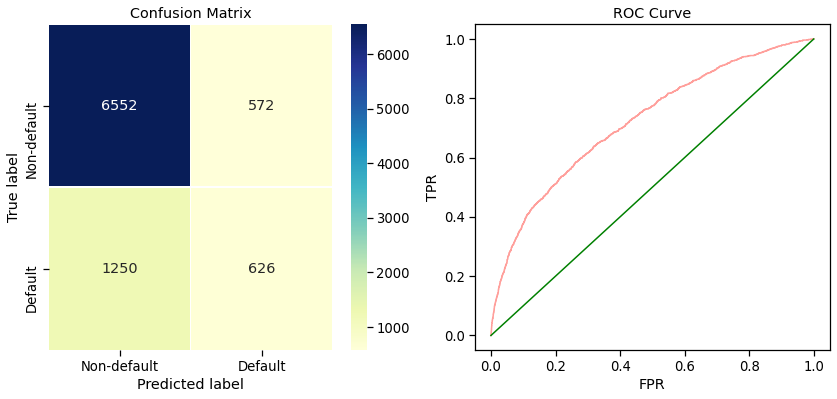

____________________________________________________________
Data is  Under Sampling  And with hyper parameter  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 14, 'min_samples_split': 34}
[14:22:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.9483832245479781
Train AUC Score 0.9916662398736712
Overall Train recall 0.8708080126040963
Overall Test Accuracy 0.7714444444444445
Test AUC Score 0.7261096159532808
Classification Report of Test
               precision    recall  f1-score   support

           0       0.85      0.86      0.86      7124
           1       0.45      0.44      0.45      1876

    accuracy                           0.77      9000
   macro avg       0.65      0.65      0.65      9

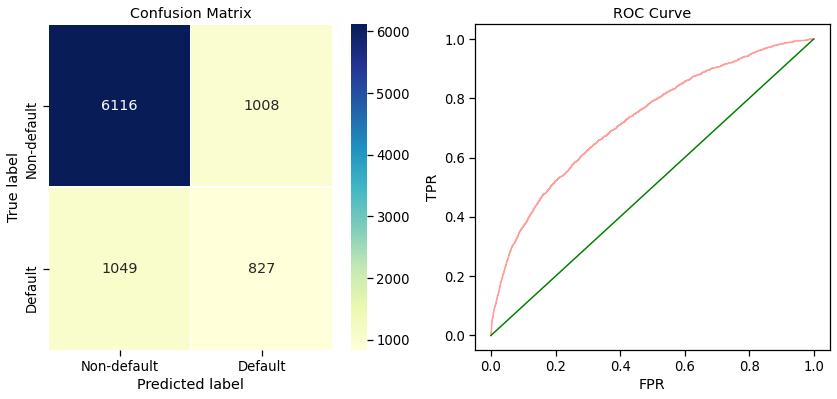

____________________________________________________________
Data is  SMOTE  And with hyper parameter  {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 18, 'min_samples_split': 33}
[14:23:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Overall Train Accuracy 0.9987618529926919
Train AUC Score 0.9999949331394925
Overall Train recall 0.9977048982303557
Overall Test Accuracy 0.7967777777777778
Test AUC Score 0.7290396273026462
Classification Report of Test
               precision    recall  f1-score   support

           0       0.84      0.92      0.88      7124
           1       0.52      0.32      0.39      1876

    accuracy                           0.80      9000
   macro avg       0.68      0.62      0.64      9000
weig

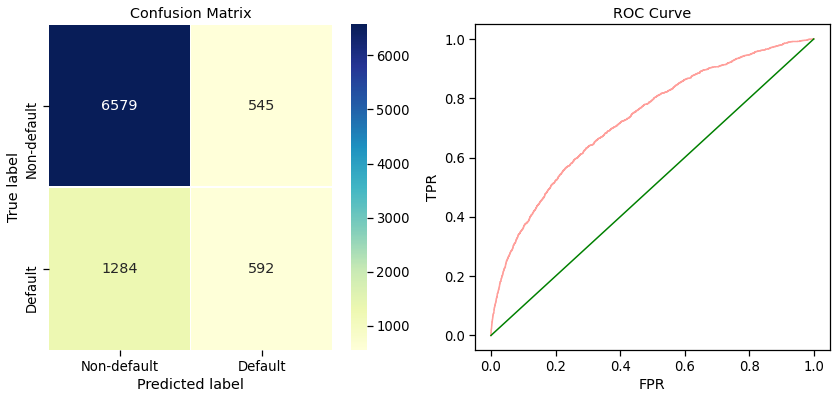

____________________________________________________________


In [76]:
# Result of each Sampling Method

index = [0,1,2,3]

for Xtrain,ytrain,sampleName,index in zip(xtrain_nf_data,ytrain_nf_data,name,index):
    print('Data is ',sampleName,' And with hyper parameter ',param_dt[index])
    model_eval(XGBClassifier(**param_xgb[index]), Xtrain, ytrain, X_nf_test, y_nf_test)
    print("_" * 60)
    
    

Based on the result of recall score, the best model is **Gaussian Naive Bayes** with **SMOTE** sampling method of the **original dataset** which reaches 89% of recall of class 1 (Default Payment Next Month).

### Feature Importance 

In [94]:
# create a function to see the feature importance of model

def plot_Feature(feature, clf):
    tmp = pd.DataFrame({'Feature': feature, 
                        'Feature importance': clf.feature_importances_})
    tmp = tmp.sort_values(by='Feature importance',ascending=False)
    fig = go.Figure(go.Bar(
    x=tmp['Feature'],y=tmp['Feature importance'],marker={'color': tmp['Feature importance'], 
    'colorscale': 'Viridis'}
    ))
    fig.update_layout(title_text='Feature Importance',xaxis_title="Feature",yaxis_title="Importance")
    return fig.show()

In [100]:
# Choose one model

param_r = {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 7, 'min_samples_split': 39}
rfc_s = DecisionTreeClassifier(**param_r,random_state = 42).fit(X_SMOTE,y_SMOTE)

In [101]:
plot_Feature(X_SMOTE.columns,rfc_s)

Based on the result of Decision Tree, the most important features are usually about the **customers' own backgrounds**, e.g. education, gender, marital status. Moreover, the **most recent payment status**, payment amount and credit limit are more important than the past history.